In [1]:
# Imports for data manipulation and visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix

# Operating System Module
import os

# TensorFlow and Keras
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from tensorflow.keras.layers import (
    Dense, Conv2D, Flatten, MaxPooling2D, BatchNormalization,
    Activation, Dropout, Concatenate, Input
)
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications import VGG16

import random
from skimage import io
from sklearn.metrics import ConfusionMatrixDisplay
from datetime import datetime

from tensorflow.keras.models import load_model


In [3]:
# Base directory path
DIR = '../Input/satellite-images-of-hurricane-damage/'

# Create complete paths for different subsets
train_path = os.path.join(DIR, 'train_another')
val_path = os.path.join(DIR, 'validation_another')
test_path = os.path.join(DIR, 'test')

## Load Training/Validation
### No image augmentation

In [5]:
# Define image size and batch size
image_size = (128, 128)
batch_size = 32
seed=42
# Create TensorFlow Datasets for training and validation using the specified parameters
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    train_path,              # Path to the training dataset
    seed=seed,               # Seed for reproducibility
    image_size=image_size,   # Target size for the images
    batch_size=batch_size    # Batch size for training
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    val_path,                # Path to the validation dataset
    seed=seed,               # Seed for reproducibility
    image_size=image_size,   # Target size for the images
    batch_size=batch_size    # Batch size for validation
)


Found 10000 files belonging to 2 classes.
Found 2000 files belonging to 2 classes.


### Loading with Image Augmentation

In [6]:
# Define parameters for image loading
image_size = (128, 128)
batch_size = 100

# TRAINING
# Specify training image transformations using ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1./255,          # Rescale pixel values to the range [0, 1]
    rotation_range=0.1,      # Randomly rotate images within the range of 0.1 degrees
    zoom_range=0.1,          # Randomly zoom into images by 0.1 times
    horizontal_flip=True     # Randomly flip images horizontally
)

# Create a generator for training data using flow_from_directory
train_generator = train_datagen.flow_from_directory(
    train_path,              # Directory containing the training images
    target_size=image_size,  # Resize images to the specified target size
    batch_size=batch_size,   # Number of images to include in each batch
    class_mode='binary'      # Binary classification, as specified by 'class_mode'
)

# VALIDATION
# Specify validation image transformations (only rescaling in this case)
val_datagen = ImageDataGenerator(rescale=1./255)

# Create a generator for validation data using flow_from_directory
validation_generator = val_datagen.flow_from_directory(
    val_path,                # Directory containing the validation images
    target_size=image_size,  # Resize images to the specified target size
    batch_size=batch_size,   # Number of images to include in each batch
    class_mode='binary'      # Binary classification, as specified by 'class_mode'
)


Found 10000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.


In [9]:
def plot_nn_training(history):
    
    '''Given model training history, plots validation accuracy and loss'''
    
    # Plot history for accuracy
    plt.plot(history.history['accuracy'])         # Training accuracy
    plt.plot(history.history['val_accuracy'])     # Validation accuracy
    plt.title('Model Accuracy')                   # Set the title for the plot
    plt.ylabel('Accuracy')                        # Set the y-axis label
    plt.xlabel('Epoch')                           # Set the x-axis label
    plt.legend(['Train', 'Validation'], loc='upper left')  # Add a legend indicating train and validation
    plt.show()                                   # Display the accuracy plot
    
    # Plot history for loss
    plt.plot(history.history['loss'])             # Training loss
    plt.plot(history.history['val_loss'])         # Validation loss
    plt.title('Model Loss')                       # Set the title for the plot
    plt.ylabel('Loss')                            # Set the y-axis label
    plt.xlabel('Epoch')                           # Set the x-axis label
    plt.legend(['Train', 'Validation'], loc='upper left')  # Add a legend indicating train and validation
    plt.show()                                   # Display the loss plot



# Baseline Model - No Image Augmentation

In [19]:
# Create a Sequential model
model = Sequential()

# Rescaling layer to normalize pixel values between 0 and 1
model.add(Rescaling(1.0 / 255))

# Convolutional layers
# First convolutional layer with 32 filters, kernel size of 5x5, and stride of 2
model.add(Conv2D(32, kernel_size=5, strides=2, padding="same", input_shape=(128, 128, 3)))
model.add(BatchNormalization())
model.add(Activation("relu"))

# Second convolutional layer with 64 filters, kernel size of 3x3, and padding
model.add(Conv2D(64, kernel_size=3, padding="same"))
model.add(BatchNormalization())
model.add(Activation("relu"))

# Third convolutional layer with 64 filters, kernel size of 3x3, and padding
model.add(Conv2D(64, kernel_size=3, padding="same"))
model.add(BatchNormalization())
model.add(Activation("relu"))

# Flatten layer to convert the 3D feature maps to a 1D vector
model.add(Flatten())

# Dense (fully connected) layers
# First dense layer with 512 neurons and ReLU activation function
model.add(Dense(512, activation='relu'))

# Second dense layer with 256 neurons and ReLU activation function
model.add(Dense(256, activation='relu'))

# Third dense layer with 128 neurons and ReLU activation function
model.add(Dense(128, activation='relu'))

# Output layer with 2 neurons (for binary classification) and softmax activation function
model.add(Dense(2, activation='softmax'))


In [22]:
# Compile the model
optimizer = 'adam' #widely used optimization algorithm
loss_function = 'sparse_categorical_crossentropy' 
model.compile(optimizer=optimizer, loss=loss_function, metrics=["accuracy"])

# Configure early stopping
es = EarlyStopping(
    monitor='val_accuracy', #monitors the validation accuracy 
    mode='max', #aims to validation accuracy
    verbose=1,
    patience=10
)

# Save the best model
mc = ModelCheckpoint(
    'models/Model1/best_model.keras',
    monitor='val_accuracy',
    mode='max',
    verbose=1,
    save_best_only=True
)

In [24]:
# Train the model
results1 = model.fit(
    train_ds,                          # Training data using TensorFlow Dataset
    epochs=50,                         # Number of epochs (iterations over the entire training dataset)
    callbacks=[es, mc],                # Callbacks for early stopping and model checkpointing
    validation_data=val_ds,            # Validation data using TensorFlow Dataset
    verbose=4                          # Verbosity level (4 for a custom level of logging)
)


Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.50050, saving model to models/Model1/best_model.keras
Epoch 2/50

Epoch 2: val_accuracy improved from 0.50050 to 0.77700, saving model to models/Model1/best_model.keras
Epoch 3/50

Epoch 3: val_accuracy improved from 0.77700 to 0.90450, saving model to models/Model1/best_model.keras
Epoch 4/50

Epoch 4: val_accuracy did not improve from 0.90450
Epoch 5/50

Epoch 5: val_accuracy did not improve from 0.90450
Epoch 6/50

Epoch 6: val_accuracy did not improve from 0.90450
Epoch 7/50

Epoch 7: val_accuracy did not improve from 0.90450
Epoch 8/50

Epoch 8: val_accuracy did not improve from 0.90450
Epoch 9/50

Epoch 9: val_accuracy did not improve from 0.90450
Epoch 10/50

Epoch 10: val_accuracy did not improve from 0.90450
Epoch 11/50

Epoch 11: val_accuracy did not improve from 0.90450
Epoch 12/50

Epoch 12: val_accuracy improved from 0.90450 to 0.91700, saving model to models/Model1/best_model.keras
Epoch 13/50

Epoch 13: val_accura

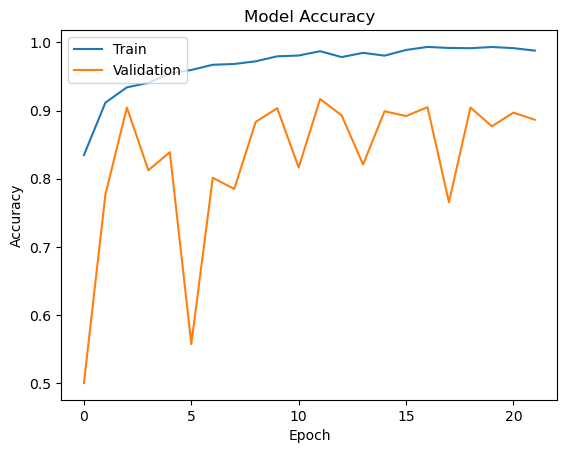

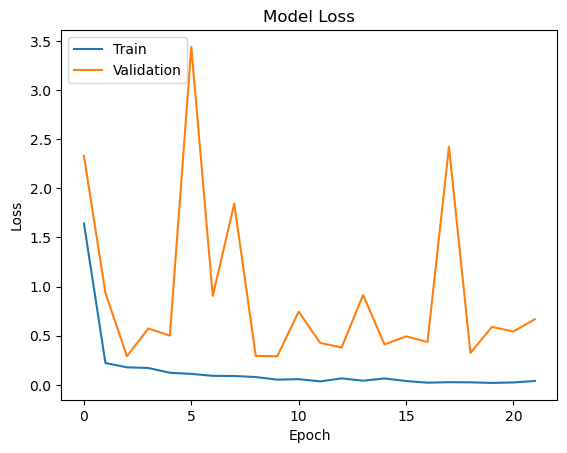

In [25]:
#plot performance by epoch 
plot_nn_training(results1)

Found 10000 files belonging to 2 classes.
4/4 [==============================] - 3s 143ms/step


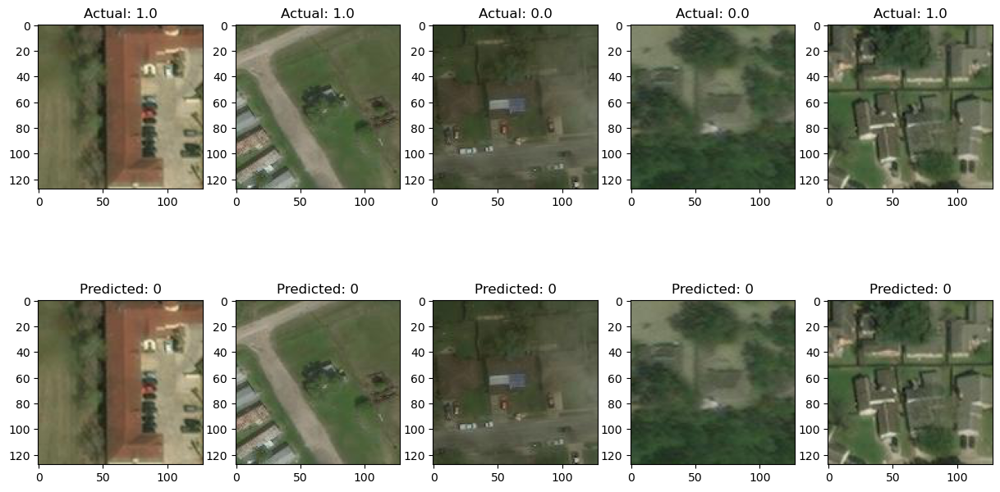

In [68]:
# Function to plot images with actual and predicted labels
def plot_images_with_predictions(model, data_generator, num_images=5):
    # Get an iterator for the dataset
    iterator = iter(data_generator)

    try:
        # Get a batch of images and labels from the iterator
        batch = next(iterator)
        images, labels = batch

        # Make predictions using the trained model
        predictions = model.predict(images)

        # Check if labels are one-dimensional
        if len(labels.shape) == 1:
            actual_labels = labels
        else:
            # Convert one-hot encoded labels to class labels
            actual_labels = np.argmax(labels, axis=1)

        # Convert predicted probabilities to class labels
        predicted_labels = np.argmax(predictions, axis=1)

        # Plot images with actual and predicted labels
        plt.figure(figsize=(15, 8))
        for i in range(num_images):
            # Clip pixel values to the valid range [0, 1]
            clipped_image = np.clip(images[i], 0, 1)

            plt.subplot(2, num_images, i + 1)
            plt.imshow(clipped_image)
            plt.title(f"Actual: {actual_labels[i]}")

            plt.subplot(2, num_images, num_images + i + 1)
            plt.imshow(clipped_image)
            plt.title(f"Predicted: {predicted_labels[i]}")

        plt.show()

    except StopIteration:
        print("End of iterator. No more batches to plot.")

# Plot images and predictions
plot_images_with_predictions(model, validation_generator, num_images=5)

# Baseline Model - With Image Augmentation

In [26]:
# create model
model_img = Sequential()

# convolution layers
model_img.add(Conv2D(32, kernel_size=5, strides=2, padding="same", input_shape=(128,128,3)))
model_img.add(BatchNormalization())
model_img.add(Activation("relu"))

model_img.add(Conv2D(64, kernel_size=3, padding="same"))
model_img.add(BatchNormalization())
model_img.add(Activation("relu"))

model_img.add(Conv2D(64, kernel_size=3, padding="same"))
model_img.add(BatchNormalization())
model_img.add(Activation("relu"))

# flatten
model_img.add(Flatten())

# dense layers
model_img.add(Dense(512, activation='relu'))
model_img.add(Dense(256, activation='relu'))
model_img.add(Dense(128, activation='relu'))

# output layer
model_img.add(Dense(2, activation='softmax')) 

In [29]:
# Compile the model
optimizer = 'adam'
loss_function = 'sparse_categorical_crossentropy'
model_img.compile(optimizer=optimizer, loss=loss_function, metrics=["accuracy"])

# Configure early stopping
es = EarlyStopping(
    monitor='val_accuracy',
    mode='max',
    verbose=1,
    patience=10
)

# Save the best model
mc = ModelCheckpoint(
    'models/Model1/best_model_img.keras',
    monitor='val_accuracy',
    mode='max',
    verbose=1,
    save_best_only=True
)

In [30]:
# Train the model
results_img = model_img.fit(
    train_generator,                    # Training data generator
    steps_per_epoch=100,                # Number of steps per epoch (batches to process)
    epochs=50,                          # Number of epochs (iterations over the entire training dataset)
    callbacks=[es, mc],                 # Callbacks for early stopping and model checkpointing
    validation_data=validation_generator,  # Validation data generator
    validation_steps=20,                # Number of steps for validation
    verbose=4                           # Verbosity level (4 for a custom level of logging)
)


Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to models/Model1/best_model_img.keras
Epoch 2/50

Epoch 2: val_accuracy did not improve from 0.50000
Epoch 3/50

Epoch 3: val_accuracy did not improve from 0.50000
Epoch 4/50

Epoch 4: val_accuracy improved from 0.50000 to 0.57200, saving model to models/Model1/best_model_img.keras
Epoch 5/50

Epoch 5: val_accuracy improved from 0.57200 to 0.86300, saving model to models/Model1/best_model_img.keras
Epoch 6/50

Epoch 6: val_accuracy did not improve from 0.86300
Epoch 7/50

Epoch 7: val_accuracy did not improve from 0.86300
Epoch 8/50

Epoch 8: val_accuracy improved from 0.86300 to 0.89300, saving model to models/Model1/best_model_img.keras
Epoch 9/50

Epoch 9: val_accuracy did not improve from 0.89300
Epoch 10/50

Epoch 10: val_accuracy did not improve from 0.89300
Epoch 11/50

Epoch 11: val_accuracy did not improve from 0.89300
Epoch 12/50

Epoch 12: val_accuracy did not improve from 0.89300
Epoch 13/50

Epoc

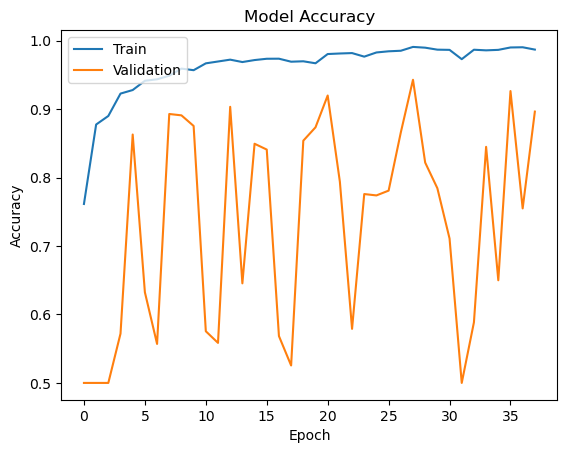

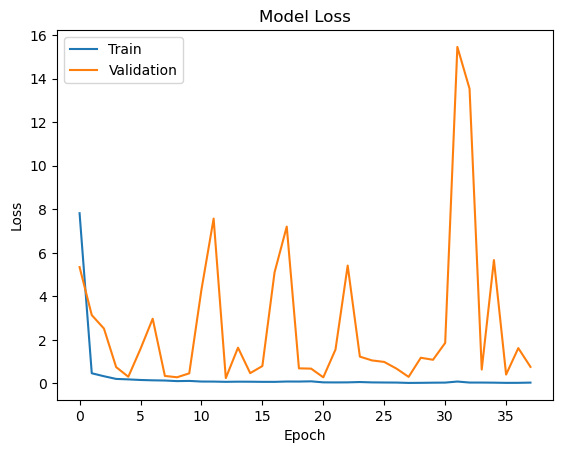

In [32]:
#plot performance by epoch 
plot_nn_training(results_img)

4/4 [==============================] - 1s 87ms/step


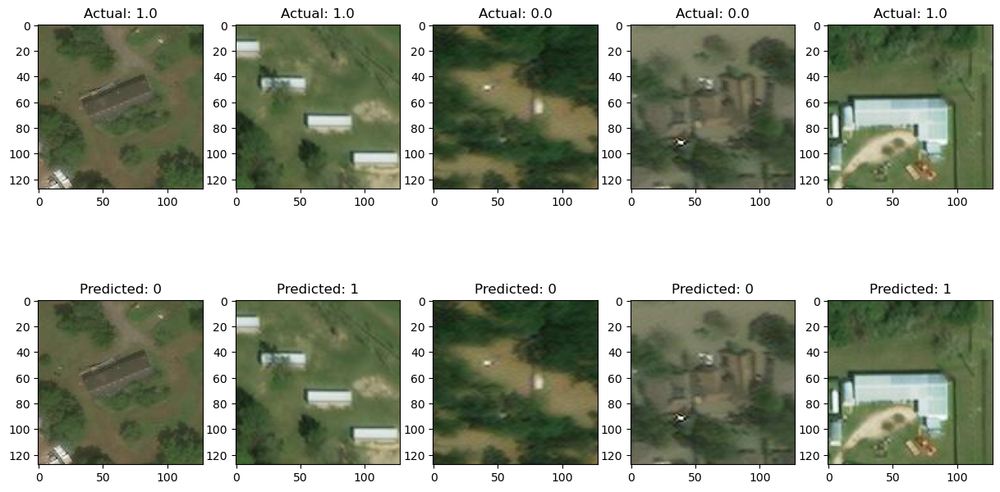

In [33]:
# Plot images and predictions
plot_images_with_predictions(model_img, validation_generator)


# Improving Model Performance

### Adding Max Pooling and Drop Layers

In [46]:
def generate_model2(input_shape, num_classes):
    """
    CNN model architecture with max pooling + dropout layers.
    Args:
    - input_shape (tuple): The shape of input data (e.g., (height, width, channels)).
    - num_classes (int): Number of output classes.

    Returns:
    - mod (Model): The constructed model.
    """
    # Input layer
    inputs = Input(shape=input_shape)

    # First Convolutional Layer with Max Pooling
    x = Conv2D(32, kernel_size=5, strides=2, padding="same")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    # Second Convolutional Layer with Max Pooling
    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    # Third Convolutional Layer with Max Pooling
    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    # Flatten the output for Dense layers
    x = Flatten()(x)

    # Dense layers with Dropout to avoid overfitting
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.1)(x)

    # Output layer
    output = Dense(num_classes, activation='softmax')(x)

    # Create and return the model
    mod = Model(inputs=inputs, outputs=output)
    return mod


In [47]:
# patient early stopping
es = EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=10)

# save best model
mc = ModelCheckpoint('models/Model2/best_model.keras', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

# Instantiate model
model2 = generate_model2(input_shape=(128,128,3), num_classes=2)

# Compile model
model2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=["accuracy"])

In [48]:
# train model
results2 = model2.fit(
    train_generator,
    steps_per_epoch=100, # num_samples//batch_size
    epochs=50,
    callbacks= [es, mc],
    validation_data=validation_generator,
    validation_steps=20, # num_samples//batch_size
    verbose=4) 

Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to models/Model2/best_model.keras
Epoch 2/50

Epoch 2: val_accuracy did not improve from 0.50000
Epoch 3/50

Epoch 3: val_accuracy did not improve from 0.50000
Epoch 4/50

Epoch 4: val_accuracy improved from 0.50000 to 0.50350, saving model to models/Model2/best_model.keras
Epoch 5/50

Epoch 5: val_accuracy improved from 0.50350 to 0.94950, saving model to models/Model2/best_model.keras
Epoch 6/50

Epoch 6: val_accuracy did not improve from 0.94950
Epoch 7/50

Epoch 7: val_accuracy did not improve from 0.94950
Epoch 8/50

Epoch 8: val_accuracy did not improve from 0.94950
Epoch 9/50

Epoch 9: val_accuracy did not improve from 0.94950
Epoch 10/50

Epoch 10: val_accuracy did not improve from 0.94950
Epoch 11/50

Epoch 11: val_accuracy did not improve from 0.94950
Epoch 12/50

Epoch 12: val_accuracy did not improve from 0.94950
Epoch 13/50

Epoch 13: val_accuracy did not improve from 0.94950
Epoch 14/50

Epoch 1

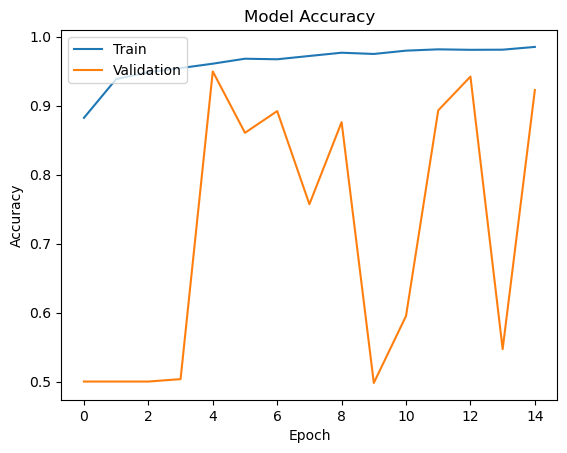

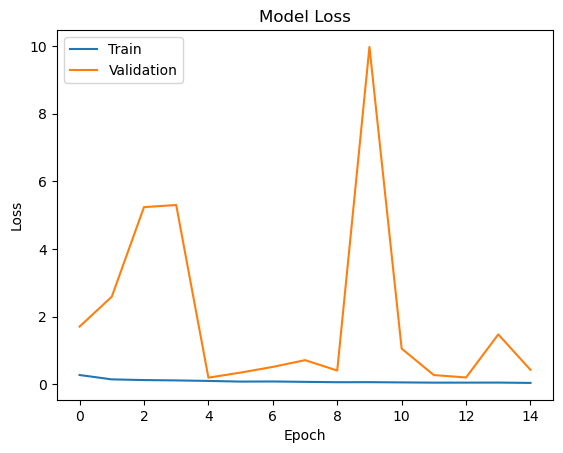

In [49]:
plot_nn_training(results2)

4/4 [==============================] - 0s 10ms/step


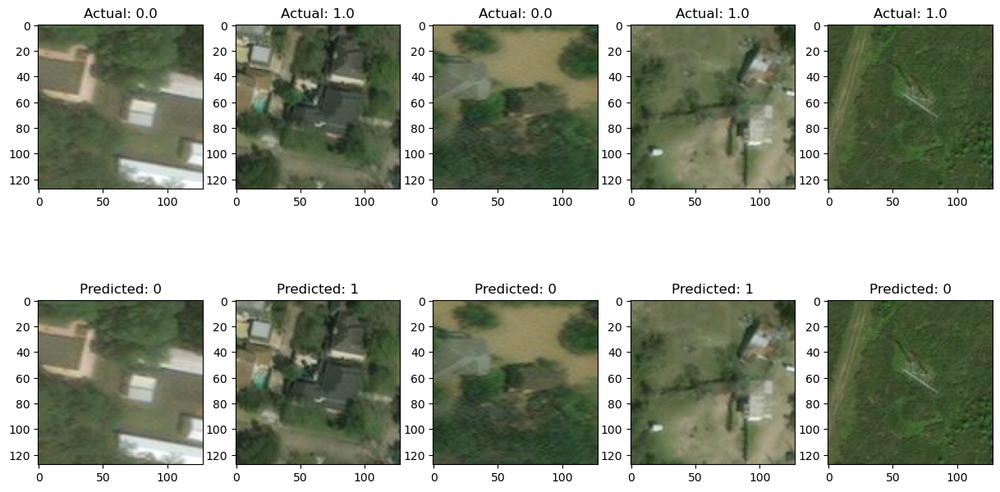

In [72]:
# Plot images and predictions
plot_images_with_predictions(model2, validation_generator)


## 2_1 Average Pooling

In [52]:

def generate_model2_1(input_shape, num_classes):
    """
    CNN model architecture with average pooling + dropout layers.
    Args:
    - input_shape (tuple): The shape of input data (e.g., (height, width, channels)).
    - num_classes (int): Number of output classes.

    Returns:
    - mod (Model): The constructed model.
    """
    # Input layer
    inputs = Input(shape=input_shape)

    # First Convolutional Layer with Average Pooling
    x = Conv2D(32, kernel_size=5, strides=2, padding="same")(inputs)
    x = AveragePooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    # Second Convolutional Layer with Average Pooling
    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = AveragePooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    # Third Convolutional Layer with Average Pooling
    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = AveragePooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    # Flatten the output for Dense layers
    x = Flatten()(x)

    # Dense layers with Dropout to avoid overfitting
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.1)(x)

    # Output layer
    output = Dense(num_classes, activation='softmax')(x)

    # Create and return the model
    mod = Model(inputs=inputs, outputs=output)
    return mod


In [53]:
# patient early stopping
es = EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=10)

# save best model
mc = ModelCheckpoint('models/Model2/best_model_1.keras', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

# Instantiate model
model2_1 = generate_model2_1(input_shape=(128,128,3), num_classes=2)

# Compile model
model2_1.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=["accuracy"])

In [55]:
# train model
results2_1 = model2_1.fit(
    train_generator,
    steps_per_epoch=100, # num_samples//batch_size
    epochs=50,
    callbacks= [es, mc],
    validation_data=validation_generator,
    validation_steps=20, # num_samples//batch_size
    verbose=4)

Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to models/Model2/best_model_1.keras
Epoch 2/50

Epoch 2: val_accuracy did not improve from 0.50000
Epoch 3/50

Epoch 3: val_accuracy did not improve from 0.50000
Epoch 4/50

Epoch 4: val_accuracy improved from 0.50000 to 0.50400, saving model to models/Model2/best_model_1.keras
Epoch 5/50

Epoch 5: val_accuracy improved from 0.50400 to 0.65900, saving model to models/Model2/best_model_1.keras
Epoch 6/50

Epoch 6: val_accuracy improved from 0.65900 to 0.83350, saving model to models/Model2/best_model_1.keras
Epoch 7/50

Epoch 7: val_accuracy did not improve from 0.83350
Epoch 8/50

Epoch 8: val_accuracy did not improve from 0.83350
Epoch 9/50

Epoch 9: val_accuracy improved from 0.83350 to 0.90050, saving model to models/Model2/best_model_1.keras
Epoch 10/50

Epoch 10: val_accuracy did not improve from 0.90050
Epoch 11/50

Epoch 11: val_accuracy did not improve from 0.90050
Epoch 12/50

Epoch 12: val_accuracy 

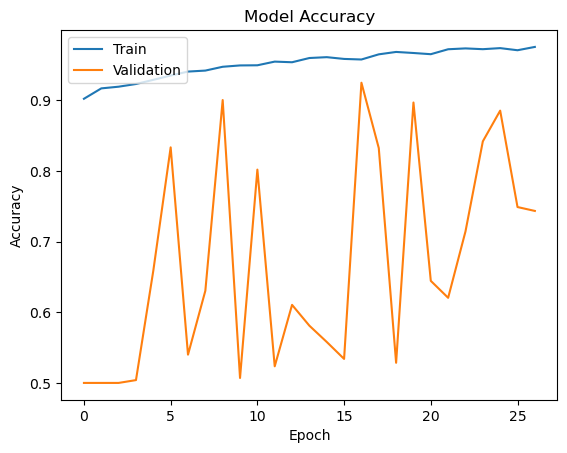

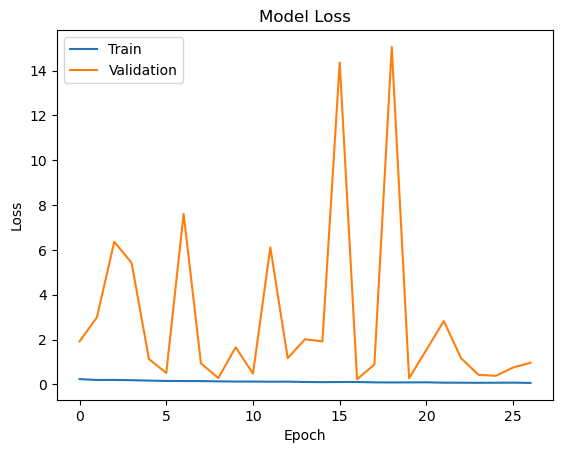

In [56]:
plot_nn_training(results2_1)

4/4 [==============================] - 0s 11ms/step


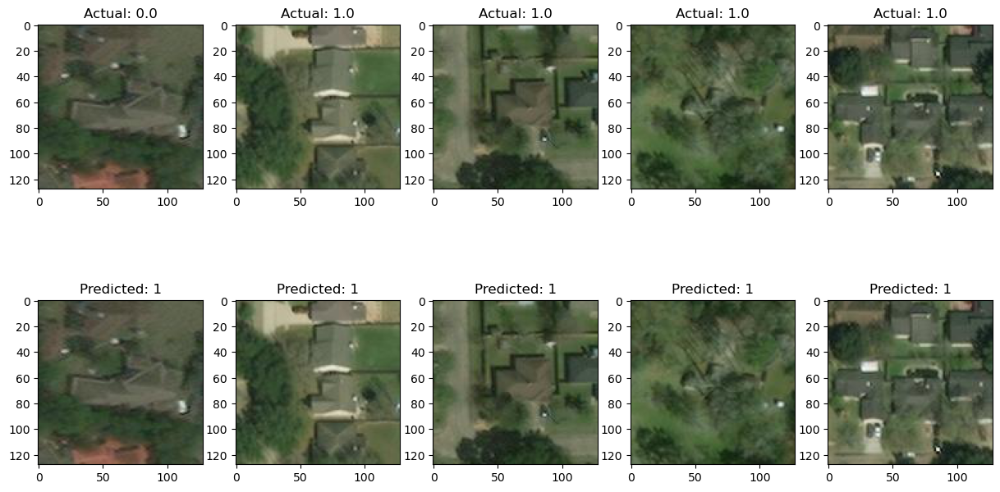

In [57]:
# Plot images and predictions
plot_images_with_predictions(model2_1, validation_generator)


# Model 3 - less dense nodes

In [58]:
# model with less dense nodes - will train faster, but will it be as accurate?
def generate_model3(input_shape, num_classes):
    
    '''CNN model architecture with max pooling + dropout layers'''
    
    inputs = Input(shape=input_shape)
    
    
    # convolution (with max pooling)
    x = Conv2D(32, kernel_size=5, strides=2, padding="same")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x) 
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    #flatten
    x = Flatten()(x)
    
    #dense layers (with dropout to avoid overfitting)
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.1)(x)
    
    # output layer
    output = Dense(2, activation='softmax')(x)
    
    mod = Model(inputs=inputs, outputs=output)
    
    return mod

In [59]:
# patient early stopping
es = EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=10)

# save best model
mc = ModelCheckpoint('models/Model3/best_model.keras', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

# Instantiate model
model3 = generate_model3(input_shape=(128,128,3), num_classes=2)

# Compile model
model3.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=["accuracy"])

In [60]:
# train model
results3 = model3.fit(
    train_generator,
    steps_per_epoch=100, # num_samples//batch_size
    epochs=50,
    callbacks= [es, mc],
    validation_data=validation_generator,
    verbose=4,
    validation_steps=20) # num_samples//batch_size

Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to models/Model3/best_model.keras
Epoch 2/50

Epoch 2: val_accuracy did not improve from 0.50000
Epoch 3/50

Epoch 3: val_accuracy did not improve from 0.50000
Epoch 4/50

Epoch 4: val_accuracy improved from 0.50000 to 0.51950, saving model to models/Model3/best_model.keras
Epoch 5/50

Epoch 5: val_accuracy did not improve from 0.51950
Epoch 6/50

Epoch 6: val_accuracy improved from 0.51950 to 0.80350, saving model to models/Model3/best_model.keras
Epoch 7/50

Epoch 7: val_accuracy did not improve from 0.80350
Epoch 8/50

Epoch 8: val_accuracy did not improve from 0.80350
Epoch 9/50

Epoch 9: val_accuracy did not improve from 0.80350
Epoch 10/50

Epoch 10: val_accuracy did not improve from 0.80350
Epoch 11/50

Epoch 11: val_accuracy did not improve from 0.80350
Epoch 12/50

Epoch 12: val_accuracy did not improve from 0.80350
Epoch 13/50

Epoch 13: val_accuracy improved from 0.80350 to 0.93600, saving model to

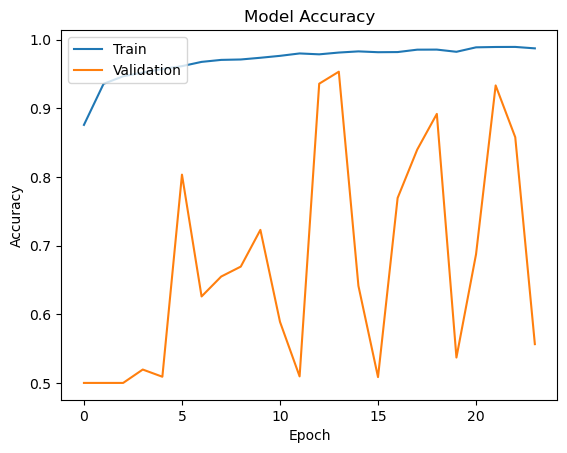

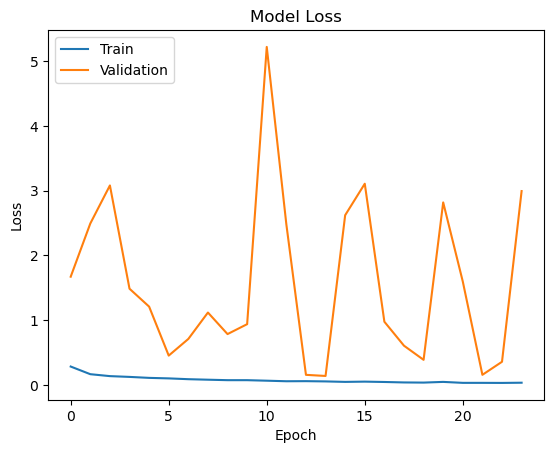

In [61]:
plot_nn_training(results3)

4/4 [==============================] - 0s 7ms/step


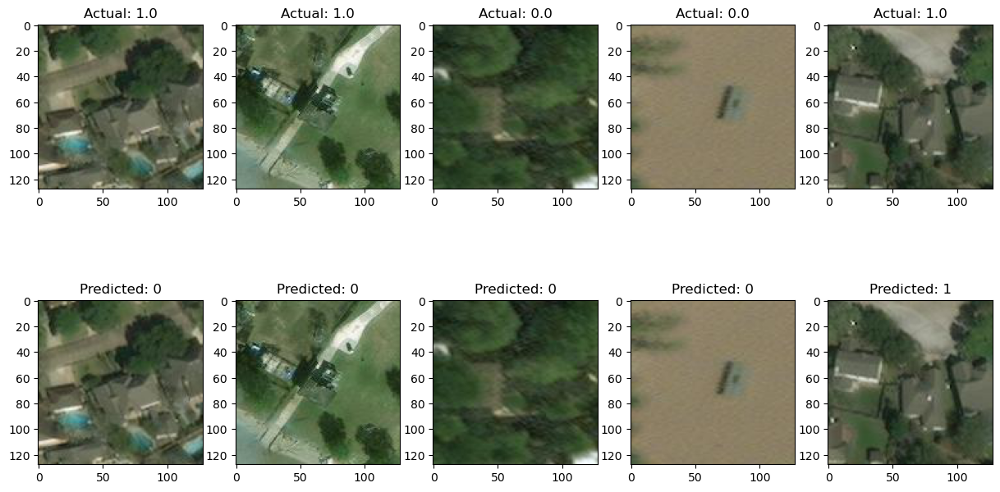

In [62]:
# Plot images and predictions
plot_images_with_predictions(model3, validation_generator)

# Model 4 - larger convolution kernel size

In [63]:
def generate_model4(input_shape, num_classes):
    
    '''CNN model architecture with max pooling + dropout layers - larger convo kernel size'''
    
    inputs = Input(shape=input_shape)
    
    # convolution (with max pooling)
    x = Conv2D(32, kernel_size=10, strides=2, padding="same")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x) 
    x = BatchNormalization()(x) # why?
    x = Activation("relu")(x)

    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    #flatten
    x = Flatten()(x)
    
    #dense layers (with dropout to avoid overfitting)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.1)(x)
    
    # output layer
    output = Dense(2, activation='softmax')(x)
    
    mod = Model(inputs=inputs, outputs=output)
    
    return mod

In [64]:
# patient early stopping
es = EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=10)

# save best model
mc = ModelCheckpoint('models/Model4/best_model.keras', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

# Instantiate model
model4 = generate_model4(input_shape=(128,128,3), num_classes=2)

# Compile model
model4.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=["accuracy"])

In [65]:
# train model
results4 = model4.fit(
    train_generator,
    steps_per_epoch=100, # num_samples//batch_size
    epochs=50,
    callbacks= [es, mc],
    validation_data=validation_generator,
    verbose=4,
    validation_steps=20) # num_samples//batch_size

Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to models/Model4/best_model.keras
Epoch 2/50

Epoch 2: val_accuracy improved from 0.50000 to 0.50200, saving model to models/Model4/best_model.keras
Epoch 3/50

Epoch 3: val_accuracy improved from 0.50200 to 0.86550, saving model to models/Model4/best_model.keras
Epoch 4/50

Epoch 4: val_accuracy did not improve from 0.86550
Epoch 5/50

Epoch 5: val_accuracy did not improve from 0.86550
Epoch 6/50

Epoch 6: val_accuracy did not improve from 0.86550
Epoch 7/50

Epoch 7: val_accuracy did not improve from 0.86550
Epoch 8/50

Epoch 8: val_accuracy did not improve from 0.86550
Epoch 9/50

Epoch 9: val_accuracy did not improve from 0.86550
Epoch 10/50

Epoch 10: val_accuracy did not improve from 0.86550
Epoch 11/50

Epoch 11: val_accuracy did not improve from 0.86550
Epoch 12/50

Epoch 12: val_accuracy did not improve from 0.86550
Epoch 13/50

Epoch 13: val_accuracy did not improve from 0.86550
Epoch 13: early stop

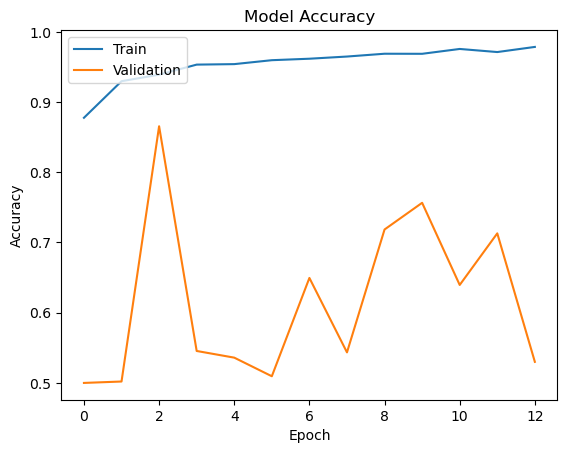

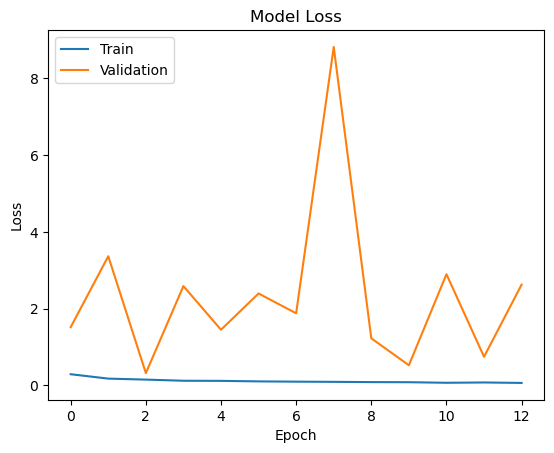

In [66]:
plot_nn_training(results4)

4/4 [==============================] - 0s 19ms/step


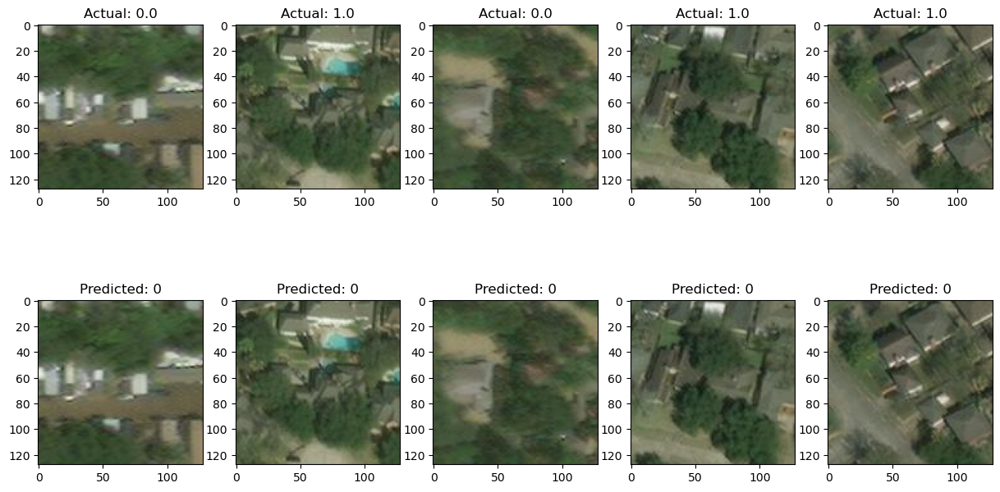

In [67]:
# Plot images and predictions
plot_images_with_predictions(model4, validation_generator)

# Transfer Learning
## TF Model 1

In [77]:
def generate_TL_model(input_shape, num_classes):
    
    weights = 'imagenet'
    inputs = Input(input_shape)

    base_model = ResNet50(include_top=False, weights=weights, input_shape=(128, 128, 3))

    #freezing the resnet layers
    for layer in base_model.layers:
        layer.trainable = False

    #these convolution layers come before the resnet layers
    x = Conv2D(32, (5, 5), strides=2, padding='same', activation='relu', input_shape=(128, 128, 3))(inputs)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)

    x = Conv2D(64, (3, 3), strides=2, padding='same', activation='relu')(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)

    x = Conv2D(64, (3, 3), strides=2, padding='same', activation='relu')(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)

    x = Flatten()(x)

    base_resnet = base_model(inputs)
    base_resnet = Flatten()(base_resnet)

    concated_layers = Concatenate()([x, base_resnet])

    # dense layers come after the resnet layers
    # dropout to reduce overfit
    concated_layers = Dense(1024, activation='relu')(concated_layers)
    concated_layers = Dropout(0.3)(concated_layers)
    concated_layers = Dense(512, activation='relu')(concated_layers)
    concated_layers = Dropout(0.2)(concated_layers)
    concated_layers = Dense(256, activation='relu')(concated_layers)
    concated_layers = Dropout(0.1)(concated_layers)
    
    # output layer
    output = Dense(num_classes, activation='softmax')(concated_layers)

    mod = Model(inputs=inputs, outputs=output)
    
    return mod

In [78]:
# patient early stopping
es = EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=10)

# save best model
mc = ModelCheckpoint('models/Model5/best_model.keras', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

# Instantiate model
TL_model = generate_TL_model(input_shape=(128,128,3), num_classes=2)

# Compile model
TL_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=["accuracy"])

In [80]:
# train model
results_TL = TL_model.fit(
    train_generator,
    steps_per_epoch=100, # num_samples//batch_size
    epochs=50,
    callbacks= [es, mc],
    validation_data=validation_generator,
    verbose=4,
    validation_steps=20) # num_samples//batch_size

Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.66800, saving model to models/Model5/best_model.keras
Epoch 2/50

Epoch 2: val_accuracy improved from 0.66800 to 0.80000, saving model to models/Model5/best_model.keras
Epoch 3/50

Epoch 3: val_accuracy did not improve from 0.80000
Epoch 4/50

Epoch 4: val_accuracy improved from 0.80000 to 0.87250, saving model to models/Model5/best_model.keras
Epoch 5/50

Epoch 5: val_accuracy improved from 0.87250 to 0.88100, saving model to models/Model5/best_model.keras
Epoch 6/50

Epoch 6: val_accuracy did not improve from 0.88100
Epoch 7/50

Epoch 7: val_accuracy did not improve from 0.88100
Epoch 8/50

Epoch 8: val_accuracy did not improve from 0.88100
Epoch 9/50

Epoch 9: val_accuracy improved from 0.88100 to 0.91400, saving model to models/Model5/best_model.keras
Epoch 10/50

Epoch 10: val_accuracy did not improve from 0.91400
Epoch 11/50

Epoch 11: val_accuracy improved from 0.91400 to 0.92450, saving model to models/Model5/best_model.

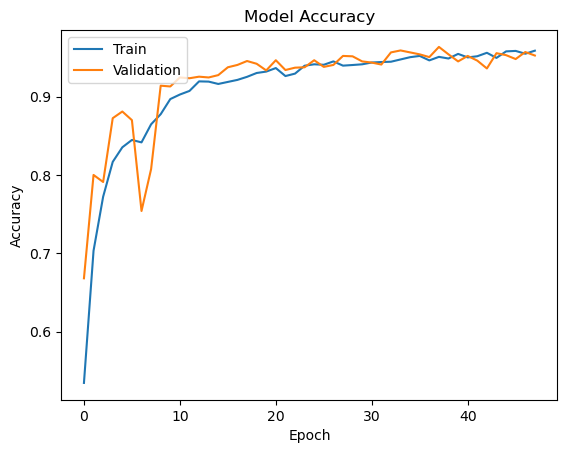

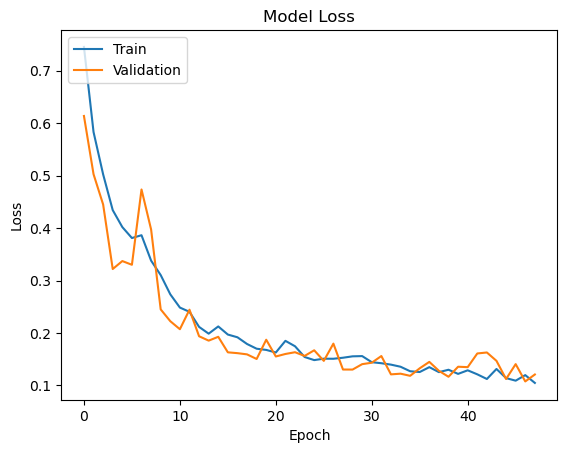

In [81]:
plot_nn_training(results_TL)

4/4 [==============================] - 2s 325ms/step


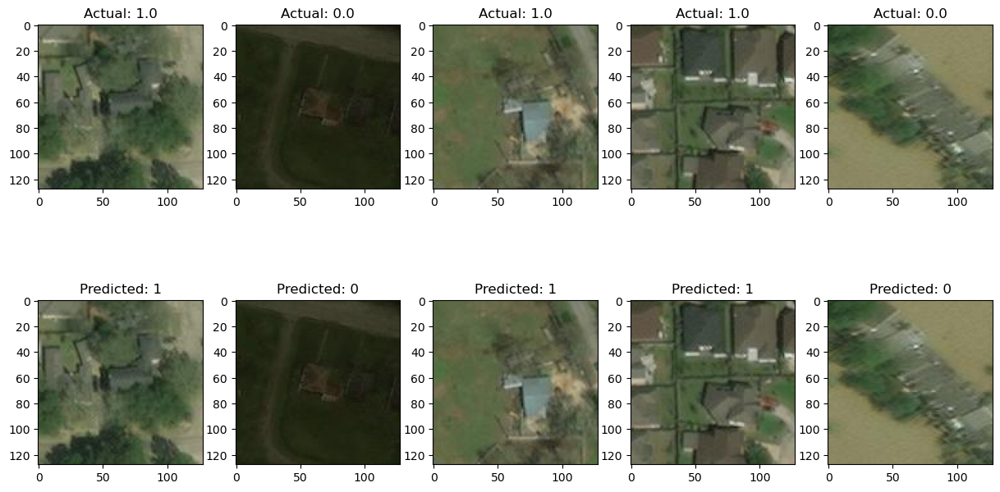

In [82]:
# Plot images and predictions
plot_images_with_predictions(TL_model, validation_generator)

# TF Model 2 - Increased kernel size

In [83]:
def generate_TL_mode_2(input_shape, num_classes):
    
    '''TL model, Conv kernel=10 '''
    
    weights = 'imagenet'
    inputs = Input(input_shape)

    #what does include_top=False remove?
    base_model = ResNet50(include_top=False, weights=weights, input_shape=(128, 128, 3))

    #freezing the resnet layers
    for layer in base_model.layers:
        layer.trainable = False

    #these convolution layers come before the resnet layers
    x = Conv2D(32, kernel_size=10, strides=2, padding='same', activation='relu', input_shape=(128, 128, 3))(inputs)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)

    x = Conv2D(64, (3, 3), strides=2, padding='same', activation='relu')(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)

    x = Conv2D(64, (3, 3), strides=2, padding='same', activation='relu')(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)

    x = Flatten()(x)

    base_resnet = base_model(inputs)
    base_resnet = Flatten()(base_resnet)

    concated_layers = Concatenate()([x, base_resnet])

    # dense layers come after the resnet layers
    # dropout to reduce overfit
    concated_layers = Dense(1024, activation='relu')(concated_layers)
    concated_layers = Dropout(0.3)(concated_layers)
    concated_layers = Dense(512, activation='relu')(concated_layers)
    concated_layers = Dropout(0.2)(concated_layers)
    concated_layers = Dense(256, activation='relu')(concated_layers)
    concated_layers = Dropout(0.1)(concated_layers)
    
    # output layer
    output = Dense(num_classes, activation='softmax')(concated_layers)

    mod = Model(inputs=inputs, outputs=output)
    
    return mod

In [84]:
# patient early stopping
es = EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=10)

# save best model
mc = ModelCheckpoint('models/Model5/best_model_10.keras', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

# Instantiate model
TL_model_2 = generate_TL_mode_2(input_shape=(128,128,3), num_classes=2)

# Compile model
TL_model_2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=["accuracy"])

In [85]:
# train model
results_TL2 = TL_model_2.fit(
    train_generator,
    steps_per_epoch=100, # num_samples//batch_size
    epochs=50,
    callbacks= [es, mc],
    validation_data=validation_generator,
    verbose=4,
    validation_steps=20) # num_samples//batch_size

Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.77300, saving model to models/Model5/best_model_10.keras
Epoch 2/50

Epoch 2: val_accuracy improved from 0.77300 to 0.77350, saving model to models/Model5/best_model_10.keras
Epoch 3/50

Epoch 3: val_accuracy improved from 0.77350 to 0.82800, saving model to models/Model5/best_model_10.keras
Epoch 4/50

Epoch 4: val_accuracy improved from 0.82800 to 0.83100, saving model to models/Model5/best_model_10.keras
Epoch 5/50

Epoch 5: val_accuracy did not improve from 0.83100
Epoch 6/50

Epoch 6: val_accuracy did not improve from 0.83100
Epoch 7/50

Epoch 7: val_accuracy improved from 0.83100 to 0.84300, saving model to models/Model5/best_model_10.keras
Epoch 8/50

Epoch 8: val_accuracy did not improve from 0.84300
Epoch 9/50

Epoch 9: val_accuracy did not improve from 0.84300
Epoch 10/50

Epoch 10: val_accuracy did not improve from 0.84300
Epoch 11/50

Epoch 11: val_accuracy improved from 0.84300 to 0.85900, saving model to models/Mod

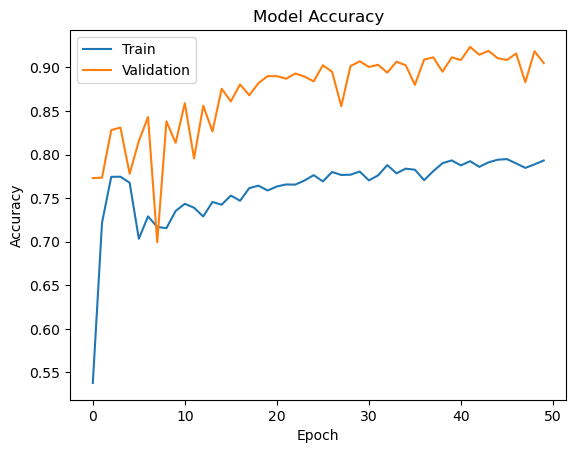

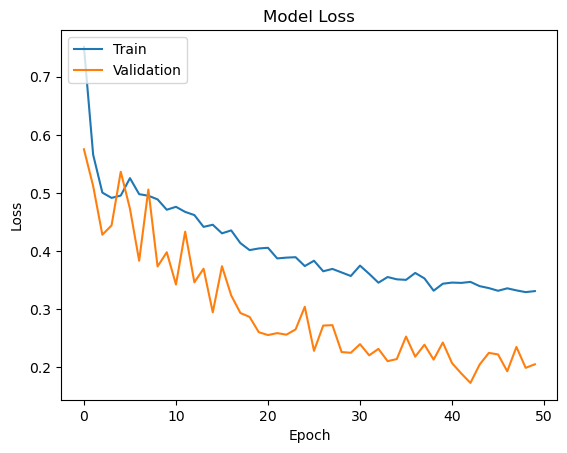

In [86]:
plot_nn_training(results_TL2)

4/4 [==============================] - 3s 640ms/step


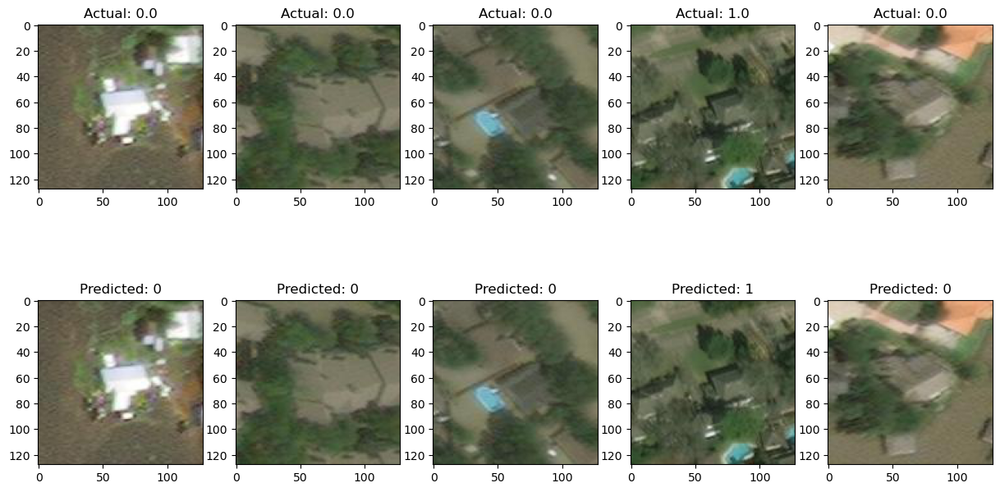

In [87]:
# Plot images and predictions
plot_images_with_predictions(TL_model_2, validation_generator)

# TF Model 3 - Reduced Learning Rate

In [88]:
#Customized adam optimizer
adam = tf.keras.optimizers.legacy.Adam(learning_rate=0.0001,
                                beta_1=0.9,
                                beta_2=0.999,
                                decay=0.0,
                                amsgrad=False)

epochs = 100

# patient early stopping
es = EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=10)

# save best model
mc = ModelCheckpoint('models/Model5/best_model_lr.keras', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

# Instantiate model (model 3 is same as 2 but with different learning rate for adam optimizer)
TL_model_3 = generate_TL_mode_2(input_shape=(128,128,3), num_classes=2)

# Compile model
TL_model_3.compile(optimizer=adam, loss='sparse_categorical_crossentropy', metrics=["accuracy"])

In [89]:
# train model
results_TL_3 = TL_model_3.fit(
    train_generator,
    steps_per_epoch=100, # num_samples//batch_size
    epochs=50,
    callbacks= [es, mc],
    validation_data=validation_generator,
    verbose=4,
    validation_steps=20) # num_samples//batch_size

Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.78500, saving model to models/Model5/best_model_lr.keras
Epoch 2/50

Epoch 2: val_accuracy improved from 0.78500 to 0.81250, saving model to models/Model5/best_model_lr.keras
Epoch 3/50

Epoch 3: val_accuracy improved from 0.81250 to 0.82950, saving model to models/Model5/best_model_lr.keras
Epoch 4/50

Epoch 4: val_accuracy improved from 0.82950 to 0.84300, saving model to models/Model5/best_model_lr.keras
Epoch 5/50

Epoch 5: val_accuracy improved from 0.84300 to 0.85150, saving model to models/Model5/best_model_lr.keras
Epoch 6/50

Epoch 6: val_accuracy improved from 0.85150 to 0.87250, saving model to models/Model5/best_model_lr.keras
Epoch 7/50

Epoch 7: val_accuracy improved from 0.87250 to 0.87300, saving model to models/Model5/best_model_lr.keras
Epoch 8/50

Epoch 8: val_accuracy did not improve from 0.87300
Epoch 9/50

Epoch 9: val_accuracy did not improve from 0.87300
Epoch 10/50

Epoch 10: val_accuracy did not improve

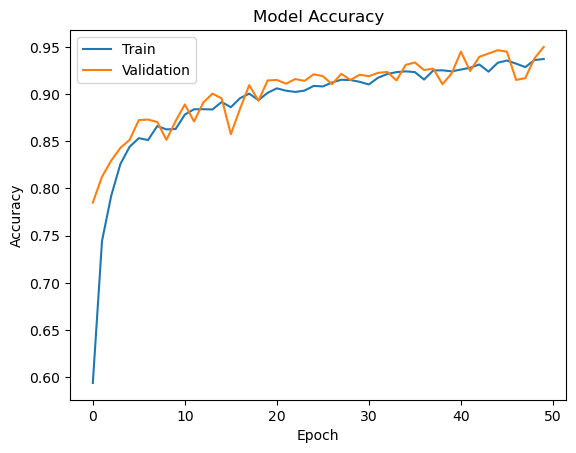

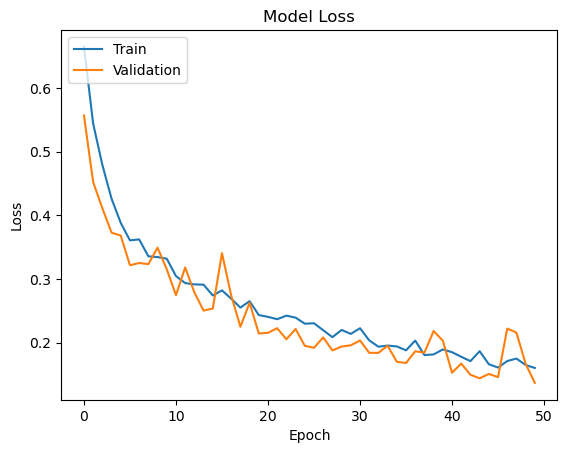

In [90]:
plot_nn_training(results_TL_3)

4/4 [==============================] - 1s 226ms/step


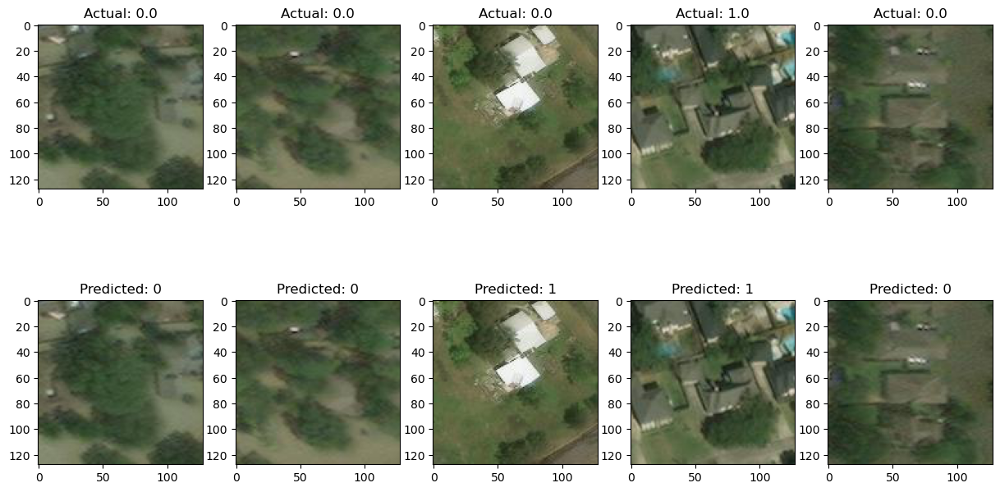

In [91]:
# Plot images and predictions
plot_images_with_predictions(TL_model_3, validation_generator)

# TF Model 4 - Reduced learning rate and Convolution Kernel Size

In [92]:
def generate_TL_model_4(input_shape, num_classes):
    
    '''TL model, Conv kernel=3 '''
    
    weights = 'imagenet'
    inputs = Input(input_shape)

    #what does include_top=False remove?
    base_model = ResNet50(include_top=False, weights=weights, input_shape=(128, 128, 3))

    #freezing the resnet layers
    for layer in base_model.layers:
        layer.trainable = False

    #these convolution layers come before the resnet layers
    x = Conv2D(32, kernel_size=3, strides=1, padding='same', activation='relu', input_shape=(128, 128, 3))(inputs)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)

    x = Conv2D(64, (3, 3), strides=2, padding='same', activation='relu')(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)

    x = Conv2D(64, (3, 3), strides=2, padding='same', activation='relu')(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)

    x = Flatten()(x)

    base_resnet = base_model(inputs)
    base_resnet = Flatten()(base_resnet)

    concated_layers = Concatenate()([x, base_resnet])

    # dense layers come after the resnet layers
    # dropout to reduce overfit
    concated_layers = Dense(1024, activation='relu')(concated_layers)
    concated_layers = Dropout(0.3)(concated_layers)
    concated_layers = Dense(512, activation='relu')(concated_layers)
    concated_layers = Dropout(0.2)(concated_layers)
    concated_layers = Dense(256, activation='relu')(concated_layers)
    concated_layers = Dropout(0.1)(concated_layers)
    
    # output layer
    output = Dense(num_classes, activation='softmax')(concated_layers)

    mod = Model(inputs=inputs, outputs=output)
    
    return mod 

In [94]:
#Adds adam optimizer
adam = tf.keras.optimizers.legacy.Adam(learning_rate=0.0001,
                                beta_1=0.9,
                                beta_2=0.999,
                                decay=0.0,
                                amsgrad=False)

# patient early stopping
es = EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=10)

# save best model
mc = ModelCheckpoint('models/Model5/best_model_tl_smallkernel.keras', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

# Instantiate model
TL_model_4 = generate_TL_model_4(input_shape=(128,128,3), num_classes=2)

# Compile model
TL_model_4.compile(optimizer=adam, loss='sparse_categorical_crossentropy', metrics=["accuracy"])

In [95]:
# train model
results_TL_4 = TL_model_4.fit(
    train_generator,
    steps_per_epoch=100, # num_samples//batch_size
    epochs=50,
    callbacks= [es, mc],
    validation_data=validation_generator,
    verbose=4,
    validation_steps=20) # num_samples//batch_size

Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.65050, saving model to models/Model5/best_model_tl_smallkernel.keras
Epoch 2/50

Epoch 2: val_accuracy improved from 0.65050 to 0.81350, saving model to models/Model5/best_model_tl_smallkernel.keras
Epoch 3/50

Epoch 3: val_accuracy improved from 0.81350 to 0.82950, saving model to models/Model5/best_model_tl_smallkernel.keras
Epoch 4/50

Epoch 4: val_accuracy improved from 0.82950 to 0.84700, saving model to models/Model5/best_model_tl_smallkernel.keras
Epoch 5/50

Epoch 5: val_accuracy improved from 0.84700 to 0.85150, saving model to models/Model5/best_model_tl_smallkernel.keras
Epoch 6/50

Epoch 6: val_accuracy improved from 0.85150 to 0.86850, saving model to models/Model5/best_model_tl_smallkernel.keras
Epoch 7/50

Epoch 7: val_accuracy improved from 0.86850 to 0.86950, saving model to models/Model5/best_model_tl_smallkernel.keras
Epoch 8/50

Epoch 8: val_accuracy improved from 0.86950 to 0.88150, saving model to models/Mo

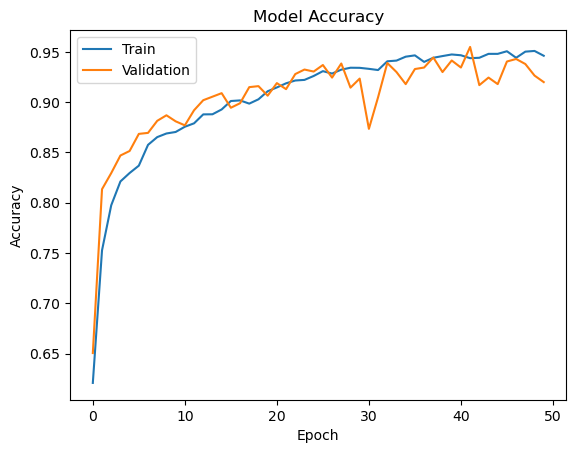

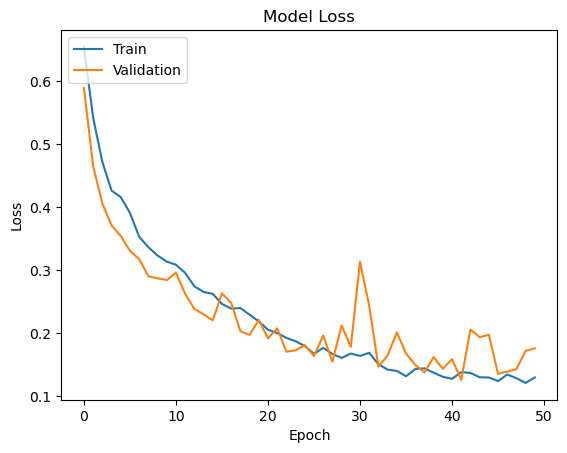

In [96]:
plot_nn_training(results_TL_4)

4/4 [==============================] - 1s 236ms/step


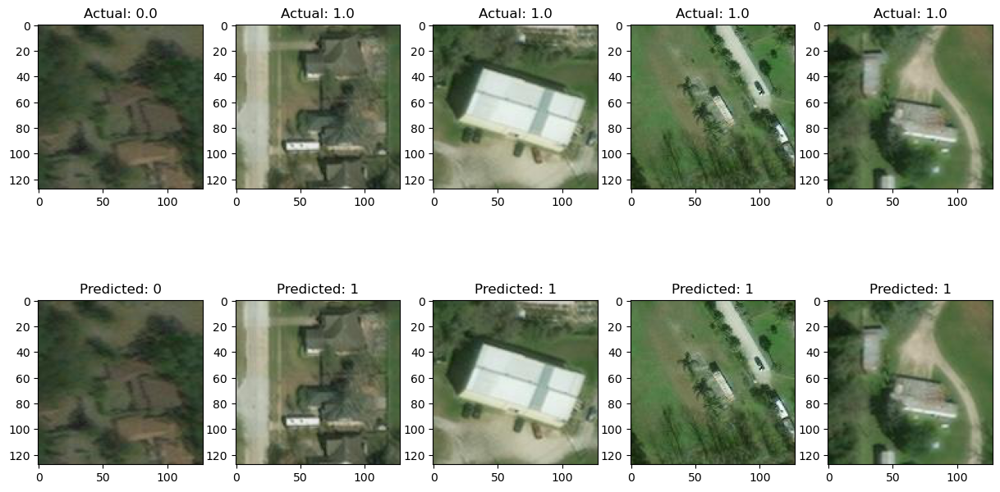

In [97]:
# Plot images and predictions
plot_images_with_predictions(TL_model_4, validation_generator)

# Transfer Learning with VGG16

In [98]:
def generate_TL_model_vgg(input_shape, num_classes):
    weights = 'imagenet'
    inputs = Input(input_shape)

    # Load VGG16 model without the top (fully connected) layers
    base_model = VGG16(include_top=False, weights=weights, input_shape=(128, 128, 3))

    # Freeze the weights of the VGG16 layers
    for layer in base_model.layers:
        layer.trainable = False

    # Convolution layers before the VGG16 layers
    x = Conv2D(32, (5, 5), strides=2, padding='same', activation='relu', input_shape=(128, 128, 3))(inputs)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)

    x = Conv2D(64, (3, 3), strides=2, padding='same', activation='relu')(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)

    x = Conv2D(64, (3, 3), strides=2, padding='same', activation='relu')(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)

    x = Flatten()(x)

    # Apply VGG16 model to the input
    base_vgg16 = base_model(inputs)
    base_vgg16 = Flatten()(base_vgg16)

    # Concatenate the features from convolution layers and VGG16 layers
    concated_layers = Concatenate()([x, base_vgg16])

    # Dense layers after concatenation
    concated_layers = Dense(1024, activation='relu')(concated_layers)
    concated_layers = Dropout(0.3)(concated_layers)
    concated_layers = Dense(512, activation='relu')(concated_layers)
    concated_layers = Dropout(0.2)(concated_layers)
    concated_layers = Dense(256, activation='relu')(concated_layers)
    concated_layers = Dropout(0.1)(concated_layers)
    
    # Output layer
    output = Dense(num_classes, activation='softmax')(concated_layers)

    # Create the final model
    model = Model(inputs=inputs, outputs=output)
    
    return model

In [100]:
# Patient early stopping
es = EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=10)

# Save the best model
mc = ModelCheckpoint('models/Model5/best_model_vgg16.keras', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

# Instantiate VGG16 model
vgg16_model = generate_TL_model_vgg(input_shape=(128, 128, 3), num_classes=2)

# Compile the model
vgg16_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=["accuracy"])

In [101]:
# Train the model
results_vgg16 = vgg16_model.fit(
    train_generator,
    steps_per_epoch=100,  # num_samples//batch_size
    epochs=50,
    callbacks=[es, mc],
    validation_data=validation_generator,
    verbose=4,
    validation_steps=20)  # num_samples//batch_size

Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.88850, saving model to models/Model5/best_model_vgg16.keras
Epoch 2/50

Epoch 2: val_accuracy improved from 0.88850 to 0.92200, saving model to models/Model5/best_model_vgg16.keras
Epoch 3/50

Epoch 3: val_accuracy improved from 0.92200 to 0.92700, saving model to models/Model5/best_model_vgg16.keras
Epoch 4/50

Epoch 4: val_accuracy did not improve from 0.92700
Epoch 5/50

Epoch 5: val_accuracy improved from 0.92700 to 0.93500, saving model to models/Model5/best_model_vgg16.keras
Epoch 6/50

Epoch 6: val_accuracy did not improve from 0.93500
Epoch 7/50

Epoch 7: val_accuracy did not improve from 0.93500
Epoch 8/50

Epoch 8: val_accuracy did not improve from 0.93500
Epoch 9/50

Epoch 9: val_accuracy improved from 0.93500 to 0.93600, saving model to models/Model5/best_model_vgg16.keras
Epoch 10/50

Epoch 10: val_accuracy improved from 0.93600 to 0.94250, saving model to models/Model5/best_model_vgg16.keras
Epoch 11/50

Epoch 11: 

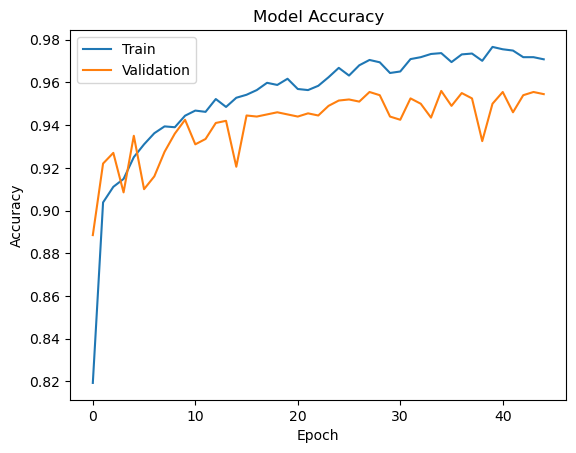

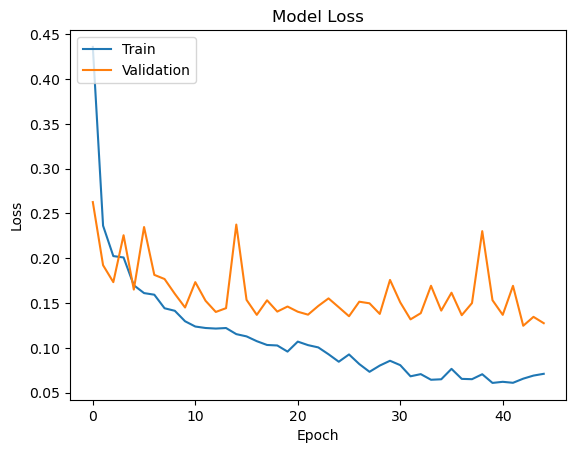

In [106]:
plot_nn_training(results_vgg16)

4/4 [==============================] - 5s 1s/step


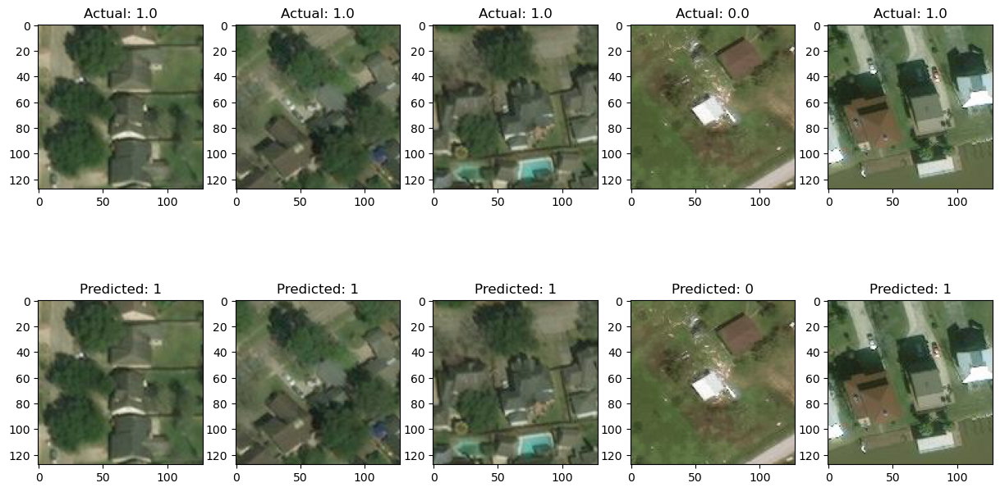

In [103]:
# Plot images and predictions
plot_images_with_predictions(vgg16_model, validation_generator)

# Non-TL Test Model 1 - with decreased learning rate

In [104]:
#Adds adam optimizer
adam = tf.keras.optimizers.legacy.Adam(learning_rate=0.0001,
                                beta_1=0.9,
                                beta_2=0.999,
                                decay=0.0,
                                amsgrad=False)

def generate_model3_lr(input_shape, num_classes):
    
    '''CNN model architecture with max pooling + dropout layers'''
    
    inputs = Input(shape=input_shape)
    
    
    # convolution (with max pooling)
    x = Conv2D(32, kernel_size=3, strides=1, padding="same")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x) 
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    #flatten
    x = Flatten()(x)
    
    #dense layers (with dropout to avoid overfitting)
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.1)(x)
    
    # output layer
    output = Dense(2, activation='softmax')(x)
    
    mod = Model(inputs=inputs, outputs=output)
    
    return mod


# patient early stopping
es = EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=10)

# save best model
mc = ModelCheckpoint('models/Model3/best_model_test.keras', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

# Instantiate model
model3_lr = generate_model3_lr(input_shape=(128,128,3), num_classes=2)

# Compile model
model3_lr.compile(optimizer=adam, loss='sparse_categorical_crossentropy', metrics=["accuracy"])

In [105]:
# train model
results3_lr = model3_lr.fit(
    train_generator,
    steps_per_epoch=100, # num_samples//batch_size
    epochs=50,
    callbacks= [es, mc],
    validation_data=validation_generator,
    verbose=4,
    validation_steps=20) # num_samples//batch_size

Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to models/Model3/best_model_test.keras
Epoch 2/50

Epoch 2: val_accuracy did not improve from 0.50000
Epoch 3/50

Epoch 3: val_accuracy did not improve from 0.50000
Epoch 4/50

Epoch 4: val_accuracy did not improve from 0.50000
Epoch 5/50

Epoch 5: val_accuracy improved from 0.50000 to 0.53000, saving model to models/Model3/best_model_test.keras
Epoch 6/50

Epoch 6: val_accuracy improved from 0.53000 to 0.82300, saving model to models/Model3/best_model_test.keras
Epoch 7/50

Epoch 7: val_accuracy improved from 0.82300 to 0.96500, saving model to models/Model3/best_model_test.keras
Epoch 8/50

Epoch 8: val_accuracy did not improve from 0.96500
Epoch 9/50

Epoch 9: val_accuracy did not improve from 0.96500
Epoch 10/50

Epoch 10: val_accuracy did not improve from 0.96500
Epoch 11/50

Epoch 11: val_accuracy did not improve from 0.96500
Epoch 12/50

Epoch 12: val_accuracy did not improve from 0.96500
Epoch 13/50



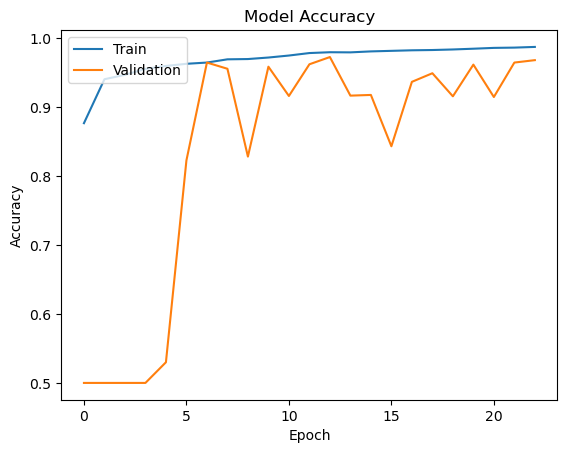

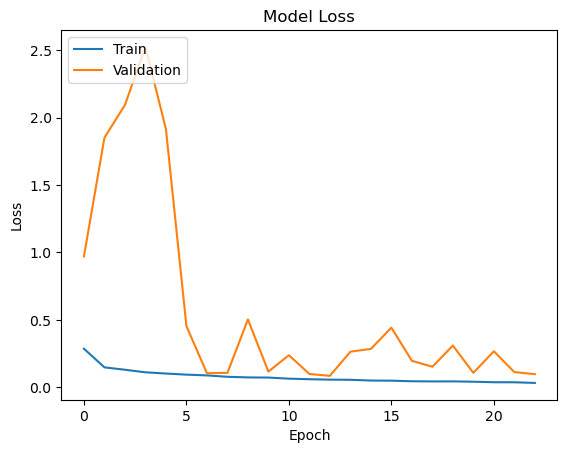

In [107]:
plot_nn_training(results3_lr)

4/4 [==============================] - 0s 20ms/step


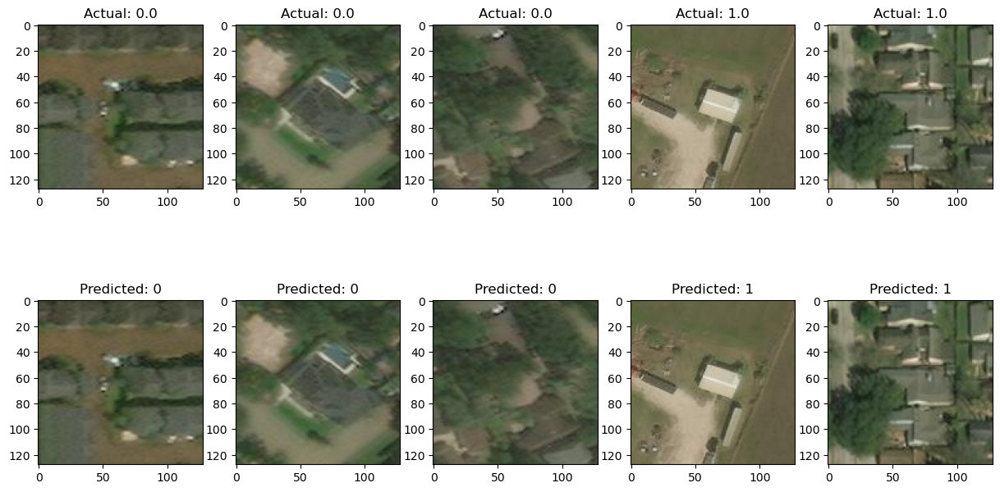

In [108]:
# Plot images and predictions
plot_images_with_predictions(model3_lr, validation_generator)

# Test Model 2 - Small Learning Rate Decay

In [111]:
# Using Adam optimizer with adjusted parameters
adam = tf.keras.optimizers.legacy.Adam(
    learning_rate=0.0001,
    beta_1=0.9,  # Default
    beta_2=0.999,  # Default
    decay=1e-6,  # A small value for learning rate decay
    amsgrad=False  # Default
)

# Rest of your model definition and training code...


In [112]:
def generate_model4_lr(input_shape, num_classes):
    '''CNN model architecture with max pooling + dropout layers'''
    inputs = Input(shape=input_shape)
    
    # convolution (with max pooling)
    x = Conv2D(32, kernel_size=3, strides=1, padding="same")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x) 
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    # flatten
    x = Flatten()(x)
    
    # dense layers (with dropout to avoid overfitting)
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.1)(x)
    
    # output layer
    output = Dense(num_classes, activation='softmax')(x)
    
    mod = Model(inputs=inputs, outputs=output)
    
    return mod

In [113]:
# patient early stopping
es = EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=10)

# save best model
mc = ModelCheckpoint('models/Model3/best_model_test_2.keras', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

# Instantiate model
model4_lr = generate_model4_lr(input_shape=(128,128,3), num_classes=2)

# Compile model
model4_lr.compile(optimizer=adam, loss='sparse_categorical_crossentropy', metrics=["accuracy"])

In [114]:
# train model
results4_lr = model4_lr.fit(
    train_generator,
    steps_per_epoch=100,  # num_samples//batch_size
    epochs=50,
    callbacks=[es, mc],
    validation_data=validation_generator,
    verbose=4,
    validation_steps=20  # num_samples//batch_size
) 

Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to models/Model3/best_model_test_2.keras
Epoch 2/50

Epoch 2: val_accuracy did not improve from 0.50000
Epoch 3/50

Epoch 3: val_accuracy did not improve from 0.50000
Epoch 4/50

Epoch 4: val_accuracy improved from 0.50000 to 0.51300, saving model to models/Model3/best_model_test_2.keras
Epoch 5/50

Epoch 5: val_accuracy improved from 0.51300 to 0.68300, saving model to models/Model3/best_model_test_2.keras
Epoch 6/50

Epoch 6: val_accuracy improved from 0.68300 to 0.94100, saving model to models/Model3/best_model_test_2.keras
Epoch 7/50

Epoch 7: val_accuracy improved from 0.94100 to 0.94200, saving model to models/Model3/best_model_test_2.keras
Epoch 8/50

Epoch 8: val_accuracy improved from 0.94200 to 0.95900, saving model to models/Model3/best_model_test_2.keras
Epoch 9/50

Epoch 9: val_accuracy did not improve from 0.95900
Epoch 10/50

Epoch 10: val_accuracy did not improve from 0.95900
Epoch 11/50

Epoc

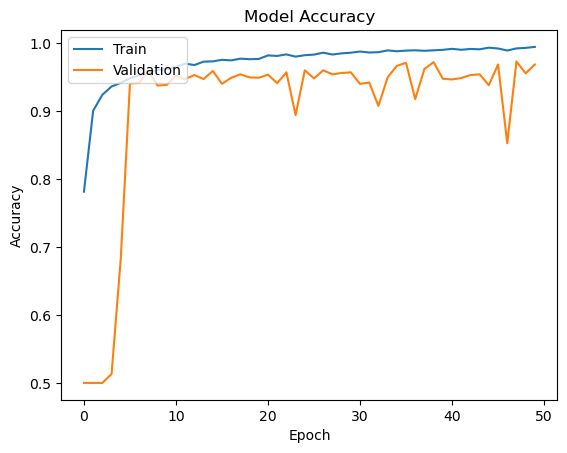

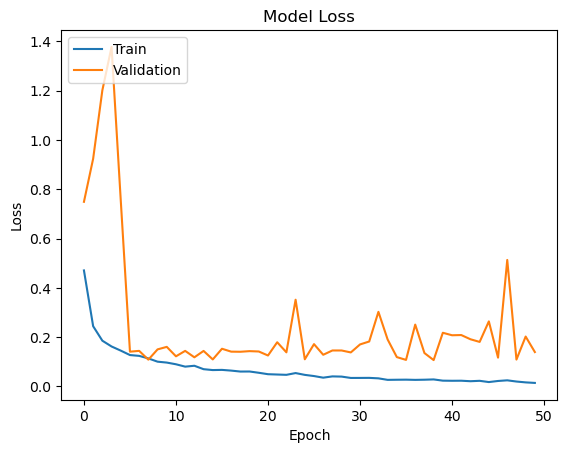

In [115]:
plot_nn_training(results4_lr)

4/4 [==============================] - 0s 17ms/step


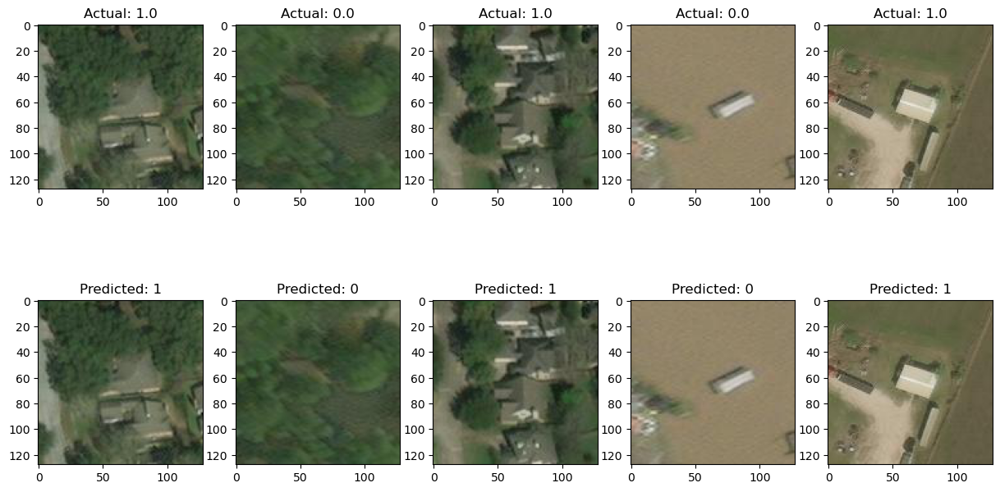

In [117]:
# Plot images and predictions
plot_images_with_predictions(model4_lr, validation_generator)

# Test Model 3 - Increased Neurons and Learning Decay

In [140]:
# Using Adam optimizer with adjusted parameters
adam = tf.keras.optimizers.legacy.Adam(
    learning_rate=0.0001,
    beta_1=0.9,  # Default
    beta_2=0.999,  # Default
    decay=1e-4,  # A small value for learning rate decay
    amsgrad=False  # Default
)

# Rest of your model definition and training code...


In [144]:
def generate_model5_lr(input_shape, num_classes):
    '''CNN model architecture with max pooling + dropout layers'''
    inputs = Input(shape=input_shape)
    
    # convolution (with max pooling)
    x = Conv2D(32, kernel_size=3, strides=1, padding="same")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x) 
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    # flatten
    x = Flatten()(x)
    
    # dense layers (with dropout to avoid overfitting)
    x = Dense(4096, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.1)(x)
    
    # output layer
    output = Dense(2, activation='sigmoid')(x)
    
    mod = Model(inputs=inputs, outputs=output)
    
    return mod

In [147]:
# patient early stopping
es = EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=10)

# save best model
mc = ModelCheckpoint('models/Model3/best_model_test_3.keras', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

# Instantiate model
model5_lr = generate_model5_lr(input_shape=(128,128,3), num_classes=2)

# Compile model
model5_lr.compile(optimizer=adam, loss='sparse_categorical_crossentropy', metrics=["accuracy"])

In [148]:
# train model
results5_lr = model5_lr.fit(
    train_generator,
    steps_per_epoch=100,  # num_samples//batch_size
    epochs=50,
    callbacks=[es, mc],
    validation_data=validation_generator,
    verbose=4,
    validation_steps=20  # num_samples//batch_size
)

Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to models/Model3/best_model_test_3.keras
Epoch 2/50

Epoch 2: val_accuracy did not improve from 0.50000
Epoch 3/50

Epoch 3: val_accuracy did not improve from 0.50000
Epoch 4/50

Epoch 4: val_accuracy improved from 0.50000 to 0.50350, saving model to models/Model3/best_model_test_3.keras
Epoch 5/50

Epoch 5: val_accuracy improved from 0.50350 to 0.61700, saving model to models/Model3/best_model_test_3.keras
Epoch 6/50

Epoch 6: val_accuracy improved from 0.61700 to 0.93600, saving model to models/Model3/best_model_test_3.keras
Epoch 7/50

Epoch 7: val_accuracy improved from 0.93600 to 0.94900, saving model to models/Model3/best_model_test_3.keras
Epoch 8/50

Epoch 8: val_accuracy did not improve from 0.94900
Epoch 9/50

Epoch 9: val_accuracy improved from 0.94900 to 0.95200, saving model to models/Model3/best_model_test_3.keras
Epoch 10/50

Epoch 10: val_accuracy improved from 0.95200 to 0.95450, saving model

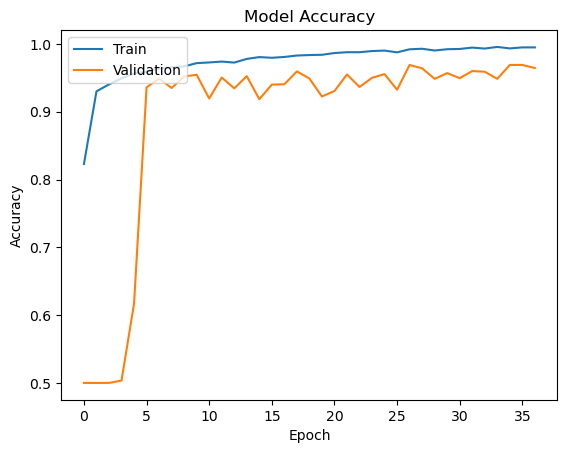

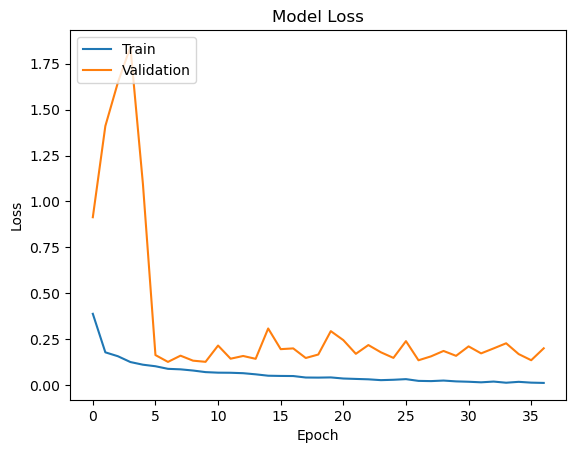

In [149]:
plot_nn_training(results5_lr)

# Test Model 4 - Increased Neurons and Max & Average Pooling


In [150]:
def generate_model6_lr(input_shape, num_classes):
    '''CNN model architecture with (max and avg) pooling + dropout layers'''
    inputs = Input(shape=input_shape)
    
    # convolution (with max pooling)
    x = Conv2D(32, kernel_size=3, strides=1, padding="same")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x) 
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    # convolution (with max pooling)
    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    # convolution (with avg pooling)
    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = AveragePooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    # flatten
    x = Flatten()(x)
    
    # dense layers (with dropout to avoid overfitting)
    x = Dense(4096, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.1)(x)
    
    # output layer
    output = Dense(2, activation='sigmoid')(x)
    
    mod = Model(inputs=inputs, outputs=output)
    
    return mod

In [151]:
# patient early stopping
es = EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=10)

# save best model
mc = ModelCheckpoint('models/Model3/best_model_test_4.keras', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

# Instantiate model
model6_lr = generate_model6_lr(input_shape=(128,128,3), num_classes=2)

# Compile model
model6_lr.compile(optimizer=adam, loss='sparse_categorical_crossentropy', metrics=["accuracy"])

In [152]:
# train model
results6_lr = model6_lr.fit(
    train_generator,
    steps_per_epoch=100,  # num_samples//batch_size
    epochs=50,
    callbacks=[es, mc],
    validation_data=validation_generator,
    verbose=4,
    validation_steps=20  # num_samples//batch_size
)

Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to models/Model3/best_model_test_4.keras
Epoch 2/50

Epoch 2: val_accuracy did not improve from 0.50000
Epoch 3/50

Epoch 3: val_accuracy did not improve from 0.50000
Epoch 4/50

Epoch 4: val_accuracy did not improve from 0.50000
Epoch 5/50

Epoch 5: val_accuracy improved from 0.50000 to 0.55350, saving model to models/Model3/best_model_test_4.keras
Epoch 6/50

Epoch 6: val_accuracy improved from 0.55350 to 0.91800, saving model to models/Model3/best_model_test_4.keras
Epoch 7/50

Epoch 7: val_accuracy improved from 0.91800 to 0.96300, saving model to models/Model3/best_model_test_4.keras
Epoch 8/50

Epoch 8: val_accuracy did not improve from 0.96300
Epoch 9/50

Epoch 9: val_accuracy did not improve from 0.96300
Epoch 10/50

Epoch 10: val_accuracy did not improve from 0.96300
Epoch 11/50

Epoch 11: val_accuracy did not improve from 0.96300
Epoch 12/50

Epoch 12: val_accuracy did not improve from 0.96300
Epoch

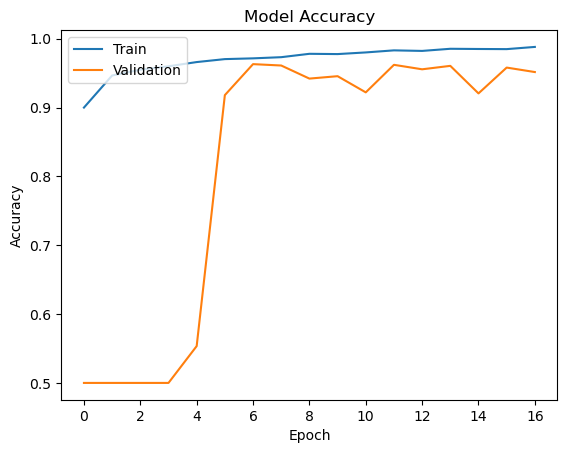

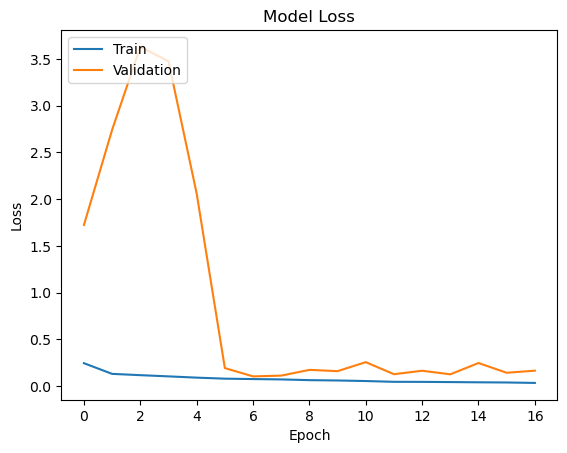

In [159]:
plot_nn_training(results6_lr)

# Test Model 5 - No Learning Decay

In [155]:
#Adds adam optimizer
adam = tf.keras.optimizers.legacy.Adam(learning_rate=0.0001,
                                beta_1=0.9,
                                beta_2=0.999,
                                decay=0.0,
                                amsgrad=False)

In [156]:
def generate_model7_lr(input_shape, num_classes):
    '''CNN model architecture with (max and avg) pooling + dropout layers'''
    inputs = Input(shape=input_shape)
    
    # convolution (with max pooling)
    x = Conv2D(32, kernel_size=3, strides=1, padding="same")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x) 
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    # convolution (with max pooling)
    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
        
    # convolution (with avg pooling)
    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = AveragePooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    # flatten
    x = Flatten()(x)
    
    # dense layers (with dropout to avoid overfitting)
    x = Dense(4096, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.1)(x)
    
    # output layer
    output = Dense(2, activation='sigmoid')(x)
    
    mod = Model(inputs=inputs, outputs=output)
    
    return mod

In [157]:
# patient early stopping
es = EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=10)

# save best model
mc = ModelCheckpoint('models/Model3/best_model_test_5.keras', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

# Instantiate model
model7_lr = generate_model7_lr(input_shape=(128,128,3), num_classes=2)

# Compile model
model7_lr.compile(optimizer=adam, loss='sparse_categorical_crossentropy', metrics=["accuracy"])

In [158]:
# train model
results7_lr = model7_lr.fit(
    train_generator,
    steps_per_epoch=100,  # num_samples//batch_size
    epochs=50,
    callbacks=[es, mc],
    validation_data=validation_generator,
    verbose=4,
    validation_steps=20  # num_samples//batch_size
)

Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to models/Model3/best_model_test_5.keras
Epoch 2/50

Epoch 2: val_accuracy did not improve from 0.50000
Epoch 3/50

Epoch 3: val_accuracy did not improve from 0.50000
Epoch 4/50

Epoch 4: val_accuracy did not improve from 0.50000
Epoch 5/50

Epoch 5: val_accuracy improved from 0.50000 to 0.60850, saving model to models/Model3/best_model_test_5.keras
Epoch 6/50

Epoch 6: val_accuracy improved from 0.60850 to 0.89800, saving model to models/Model3/best_model_test_5.keras
Epoch 7/50

Epoch 7: val_accuracy improved from 0.89800 to 0.96000, saving model to models/Model3/best_model_test_5.keras
Epoch 8/50

Epoch 8: val_accuracy did not improve from 0.96000
Epoch 9/50

Epoch 9: val_accuracy did not improve from 0.96000
Epoch 10/50

Epoch 10: val_accuracy did not improve from 0.96000
Epoch 11/50

Epoch 11: val_accuracy did not improve from 0.96000
Epoch 12/50

Epoch 12: val_accuracy improved from 0.96000 to 0.96450, 

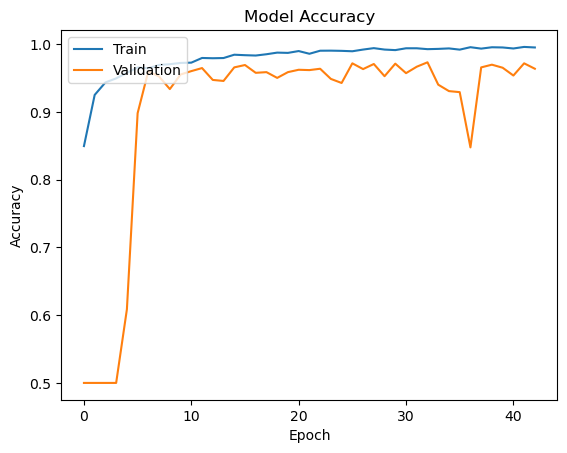

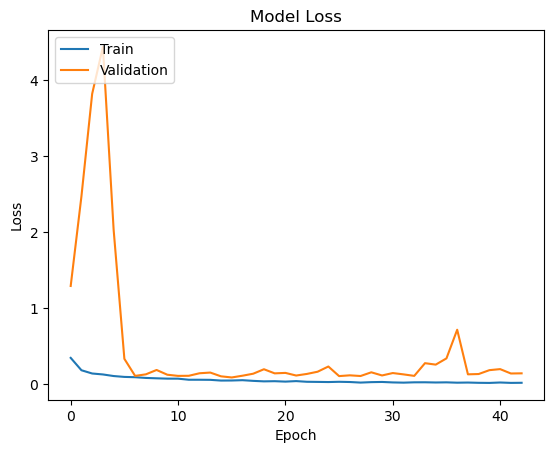

In [160]:
plot_nn_training(results7_lr)

# Test Model 6 - Increased Strides

In [185]:
def generate_model8_lr(input_shape, num_classes):
    '''CNN model architecture with increased kernel size + (max and avg) pooling + dropout layers'''
    inputs = Input(shape=input_shape)
    
    # convolution (with max pooling)
    x = Conv2D(32, kernel_size=3, strides=2, padding="same")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x) 
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = AveragePooling2D(pool_size=(2, 2), strides=2, padding='valid', data_format=None)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    # flatten
    x = Flatten()(x)
    
    # dense layers (with dropout to avoid overfitting)
    x = Dense(4096, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.2)(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.1)(x)
    
    # output layer
    output = Dense(2, activation='sigmoid')(x)
    
    mod = Model(inputs=inputs, outputs=output)
    
    return mod

In [186]:
# patient early stopping
es = EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=10)

# save best model
mc = ModelCheckpoint('models/Model3/best_model_test_6.keras', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

# Instantiate model
model8_lr = generate_model8_lr(input_shape=(128,128,3), num_classes=2)

# Compile model
model8_lr.compile(optimizer=adam, loss='sparse_categorical_crossentropy', metrics=["accuracy"])

In [187]:
# train model
results8_lr = model8_lr.fit(
    train_generator,
    steps_per_epoch=100,  # num_samples//batch_size
    epochs=50,
    callbacks=[es, mc],
    validation_data=validation_generator,
    verbose=4,
    validation_steps=20  # num_samples//batch_size
)

Epoch 1/50

Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to models/Model3/best_model_test_6.keras
Epoch 2/50

Epoch 2: val_accuracy did not improve from 0.50000
Epoch 3/50

Epoch 3: val_accuracy did not improve from 0.50000
Epoch 4/50

Epoch 4: val_accuracy improved from 0.50000 to 0.50650, saving model to models/Model3/best_model_test_6.keras
Epoch 5/50

Epoch 5: val_accuracy improved from 0.50650 to 0.53250, saving model to models/Model3/best_model_test_6.keras
Epoch 6/50

Epoch 6: val_accuracy improved from 0.53250 to 0.74200, saving model to models/Model3/best_model_test_6.keras
Epoch 7/50

Epoch 7: val_accuracy improved from 0.74200 to 0.87950, saving model to models/Model3/best_model_test_6.keras
Epoch 8/50

Epoch 8: val_accuracy improved from 0.87950 to 0.91600, saving model to models/Model3/best_model_test_6.keras
Epoch 9/50

Epoch 9: val_accuracy improved from 0.91600 to 0.94300, saving model to models/Model3/best_model_test_6.keras
Epoch 10/50

Epoch 10: 

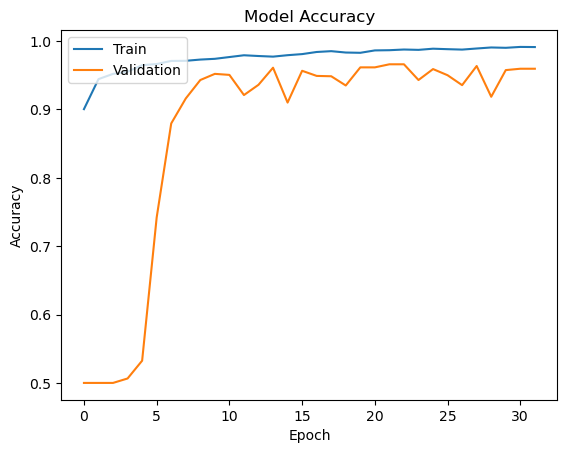

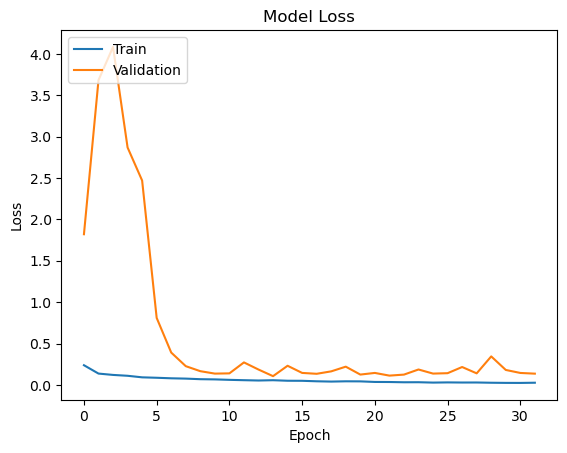

In [188]:
plot_nn_training(results8_lr)

## Evaluating different models performance on the validation dataset

In [133]:
# Base directory path
DIR = '../Input/satellite-images-of-hurricane-damage/'

val_path = os.path.join(DIR, 'validation_another')


In [137]:
val_path

'../Input/satellite-images-of-hurricane-damage/validation_another'

In [136]:
# load test data
image_size = (128, 128)
batch_size = 32

# specify test image transformations (rescale only)
val_datagen = ImageDataGenerator(rescale=1./255)

#test images, no shuffle (so results can be matched to image filenames)
val_generator = val_datagen.flow_from_directory(
        val_path,
        target_size=image_size,
        batch_size=batch_size,
        shuffle=False,
        class_mode='binary')

Found 2000 images belonging to 2 classes.


In [130]:
def find_missclassed_images(model):
    '''Given a model, returns a dataframe of misclassified images and confusion matrix
    
    Args:
    - model: The trained model for which misclassifications need to be identified
    
    Returns:
    - misslabelled: DataFrame containing information about misclassified images
    - y_true: True labels of the test data
    - y_pred: Predicted labels by the model
    '''
    
    # Get true labels and predictions
    true_labels = val_generator.classes
    predictions = best_model.predict(val_generator, verbose=1)
    
    # Switching labels to be more intuitive (if needed)
    y_true = np.array([1 if x == 0 else 0 for x in true_labels])
    pred_interim = [np.argmax(x) for x in predictions]
    y_pred = np.array([1 if x == 0 else 0 for x in pred_interim])

    
    # Get filenames, create DataFrame from the dictionary
    filenames = val_generator.filenames
    df_dict = {'filenames': filenames, 'true_label': y_true, 'pred_label': y_pred}
    df = pd.DataFrame(df_dict)
    
    # Identify misclassified images
    misslabelled = df[df['true_label'] != df['pred_label']]
    
    return misslabelled, y_true, y_pred


# Test Models

In [204]:
# Load multiple models
model_paths = ['models/Model3/best_model_test.keras','models/Model3/best_model_test_2.keras',
               'models/Model3/best_model_test_3.keras','models/Model3/best_model_test_4.keras',
              'models/Model3/best_model_test_5.keras','models/Model3/best_model_test_6.keras']

63/63 [==============================] - 1s 11ms/step


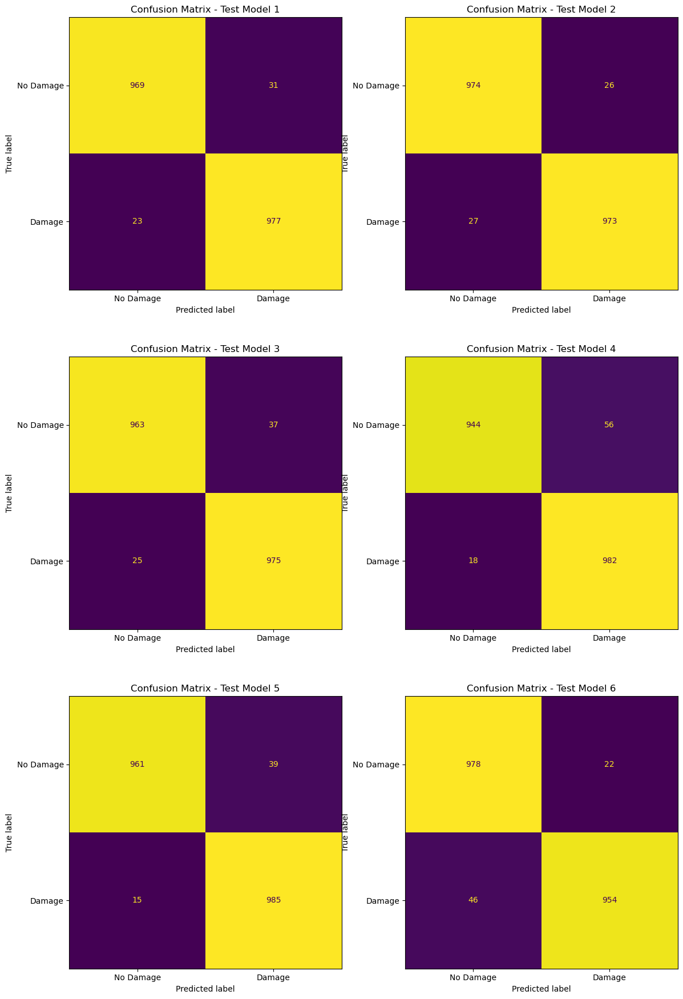

In [190]:
# Create a list to store results
results_list = []

# Plot confusion matrices in separate subplots with 2 columns
num_cols = 2
num_rows = len(model_paths) // num_cols + (len(model_paths) % num_cols > 0)

fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 6 * num_rows))

for i, model_path in enumerate(model_paths):
    best_model = load_model(model_path)
    eval_results = best_model.evaluate(x=val_generator, verbose=1)
    missclass_df, true, pred = find_missclassed_images(best_model)
    
    # Append results to the list
    results_list.append({
        'Model': model_path,
        'Confusion Matrix': confusion_matrix(true, pred),
        'Misclassified Images': missclass_df
    })
    
    # Plot confusion matrix in the corresponding subplot
    row, col = divmod(i, num_cols)
    if num_rows == 1:  # Adjust indexing if there is only one row
        ax = axs[col]
    else:
        ax = axs[row, col]
    
    cm = confusion_matrix(true, pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Damage', 'Damage'])
    
    # Plot the confusion matrix
    disp.plot(ax=ax, values_format='d',colorbar=False)
    ax.set_title(f"Confusion Matrix - Test Model {i + 1}")

# Adjust layout
plt.tight_layout()
plt.show()

In [206]:

# Create a list to store results
results_list = []

# Loop through each model
for i, model_path in enumerate(model_paths):
    best_model = load_model(model_path)
    eval_results = best_model.evaluate(x=val_generator, verbose=1)
    missclass_df, true, pred = find_missclassed_images(best_model)

    # Append results to the list
    results_list.append({
        'Model': model_path,
        'Accuracy': accuracy_score(true, pred),
        'Precision': precision_score(true, pred),
        'Recall': recall_score(true, pred),
        'True Positive Rate (Sensitivity)': recall_score(true, pred),
        'False Positive Rate': confusion_matrix(true, pred)[0, 1] / (confusion_matrix(true, pred)[0, 1] + confusion_matrix(true, pred)[0, 0])
    })

# Create a DataFrame from the results
results_df = pd.DataFrame(results_list)

# Print or use the DataFrame as needed
print(results_df)


63/63 [==============================] - 1s 9ms/step
                                   Model  Accuracy  Precision  Recall  \
0    models/Model3/best_model_test.keras    0.9730   0.969246   0.977   
1  models/Model3/best_model_test_2.keras    0.9735   0.973974   0.973   
2  models/Model3/best_model_test_3.keras    0.9690   0.963439   0.975   
3  models/Model3/best_model_test_4.keras    0.9630   0.946050   0.982   
4  models/Model3/best_model_test_5.keras    0.9730   0.961914   0.985   
5  models/Model3/best_model_test_6.keras    0.9660   0.977459   0.954   

   True Positive Rate (Sensitivity)  False Positive Rate  
0                             0.977                0.031  
1                             0.973                0.026  
2                             0.975                0.037  
3                             0.982                0.056  
4                             0.985                0.039  
5                             0.954                0.022  


63/63 [==============================] - 1s 11ms/step


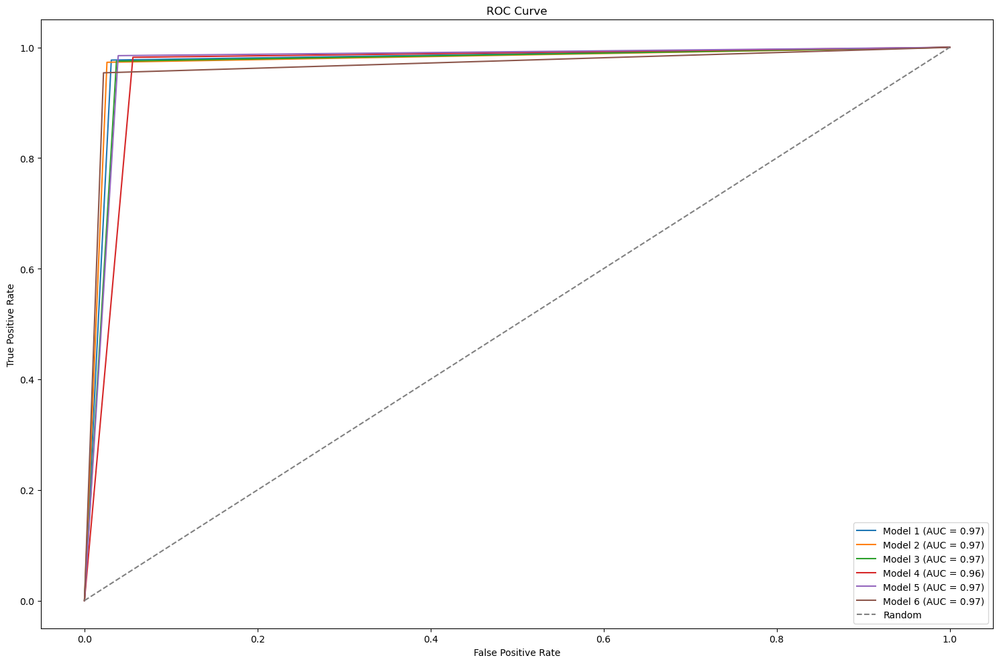

In [205]:
# Plot only ROC curves in a single subplot
num_models = len(model_paths)

# Create a single subplot for ROC curves
fig, ax_roc = plt.subplots(figsize=(15 , 10))

results_list = []

for i, model_path in enumerate(model_paths):
    best_model = load_model(model_path)
    eval_results = best_model.evaluate(x=val_generator, verbose=1)
    missclass_df, true, pred = find_missclassed_images(best_model)
    
    # Append results to the list
    results_list.append({
        'Model': model_path,
        'AUC': None  # Placeholder for AUC value, as it's calculated in the next step
    })

    # Plot ROC curve in the single subplot
    fpr, tpr, _ = roc_curve(true, pred)
    roc_auc = auc(fpr, tpr)
    
    ax_roc.plot(fpr, tpr, label=f'Model {i + 1} (AUC = {roc_auc:.2f})')

# Plot details for the ROC curve
ax_roc.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
ax_roc.set_xlabel('False Positive Rate')
ax_roc.set_ylabel('True Positive Rate')
ax_roc.set_title('ROC Curve')
ax_roc.legend()

# Adjust layout
plt.tight_layout()
plt.show()


# TL Models

63/63 [==============================] - 82s 1s/step


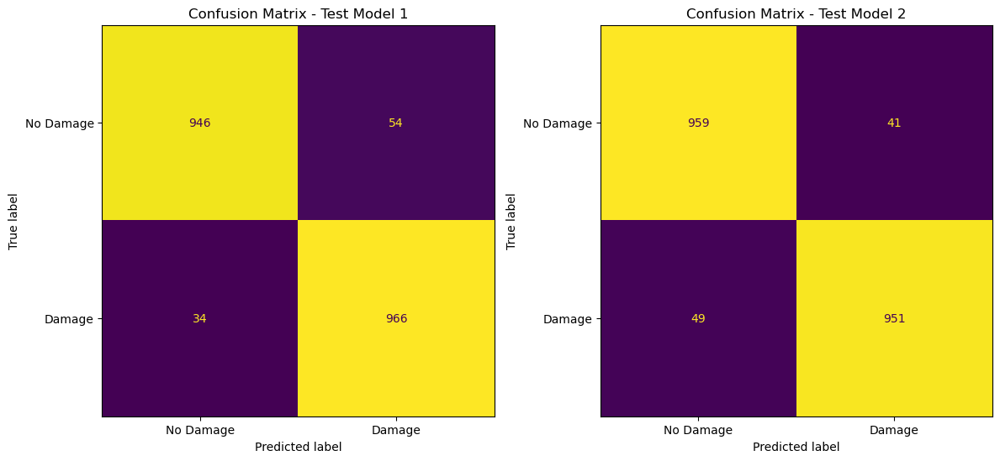

In [139]:
# Load multiple models
model_paths = ['models/Model5/best_model_vgg16.keras','models/Model5/best_model_tl_smallkernel.keras']

# Create a list to store results
results_list = []

# Plot confusion matrices in separate subplots with 2 columns
num_cols = 2
num_rows = len(model_paths) // num_cols + (len(model_paths) % num_cols > 0)

fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 6 * num_rows))

for i, model_path in enumerate(model_paths):
    best_model = load_model(model_path)
    eval_results = best_model.evaluate(x=val_generator, verbose=1)
    missclass_df, true, pred = find_missclassed_images(best_model)
    
    # Append results to the list
    results_list.append({
        'Model': model_path,
        'Confusion Matrix': confusion_matrix(true, pred),
        'Misclassified Images': missclass_df
    })
    
    # Plot confusion matrix in the corresponding subplot
    row, col = divmod(i, num_cols)
    if num_rows == 1:  # Adjust indexing if there is only one row
        ax = axs[col]
    else:
        ax = axs[row, col]
    
    cm = confusion_matrix(true, pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Damage', 'Damage'])
    
    # Plot the confusion matrix
    disp.plot(ax=ax, values_format='d',colorbar=False)
    ax.set_title(f"Confusion Matrix - Test Model {i + 1}")

# Adjust layout
plt.tight_layout()
plt.show()

63/63 [==============================] - 19s 294ms/step


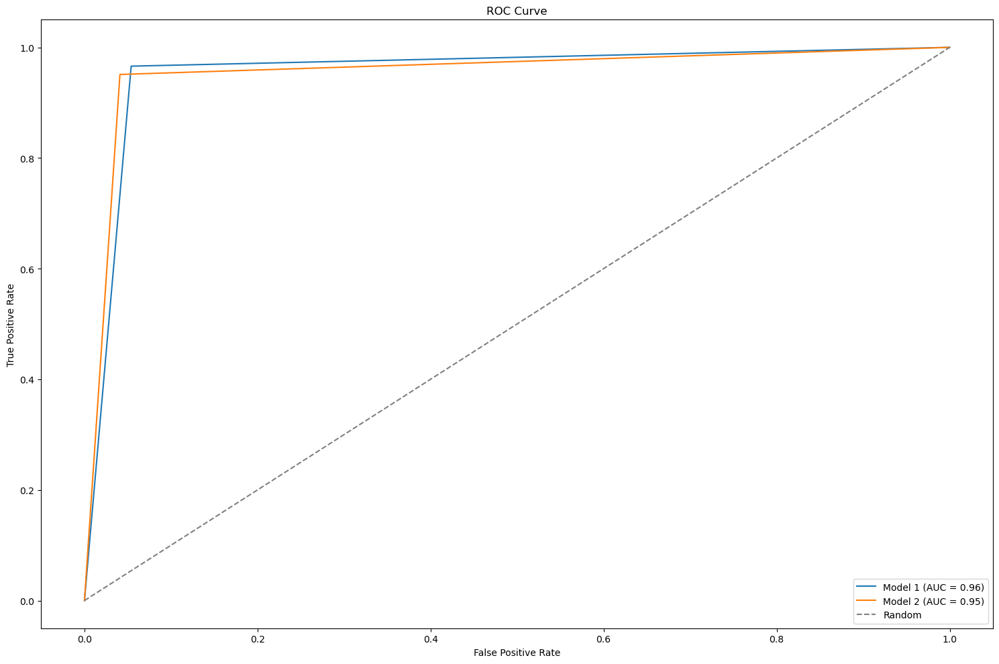

In [202]:
# Load multiple models
model_paths = ['models/Model5/best_model_vgg16.keras','models/Model5/best_model_tl_smallkernel.keras']

# Plot only ROC curves in a single subplot
num_models = len(model_paths)

# Create a single subplot for ROC curves
fig, ax_roc = plt.subplots(figsize=(15 , 10))

results_list = []

for i, model_path in enumerate(model_paths):
    best_model = load_model(model_path)
    eval_results = best_model.evaluate(x=val_generator, verbose=1)
    missclass_df, true, pred = find_missclassed_images(best_model)
    
    # Append results to the list
    results_list.append({
        'Model': model_path,
        'AUC': None  # Placeholder for AUC value, as it's calculated in the next step
    })

    # Plot ROC curve in the single subplot
    fpr, tpr, _ = roc_curve(true, pred)
    roc_auc = auc(fpr, tpr)
    
    ax_roc.plot(fpr, tpr, label=f'Model {i + 1} (AUC = {roc_auc:.2f})')

# Plot details for the ROC curve
ax_roc.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
ax_roc.set_xlabel('False Positive Rate')
ax_roc.set_ylabel('True Positive Rate')
ax_roc.set_title('ROC Curve')
ax_roc.legend()

# Adjust layout
plt.tight_layout()
plt.show()
